In [3]:
!pip install ultralytics opencv-python pillow seaborn pandas easyocr gdown scikit-image imagehash

  Using cached numpy-2.3.2-cp312-cp312-win_amd64.whl.metadata (60 kB)
  Using cached numpy-2.2.6-cp312-cp312-win_amd64.whl.metadata (60 kB)
Using cached numpy-2.2.6-cp312-cp312-win_amd64.whl (12.6 MB)


In [4]:
!pip install seaborn

In [9]:
!pip check

No broken requirements found.


In [7]:
!pip install scikit-image scipy xyzservices pywavelets lxml blinker pyarrow pydeck tenacity watchdog py-cpuinfo xgboost


In [13]:
!pip install albumentations

   ---------------------------------------- 0.0/2.0 MB ? eta -:--:--
   ----- ---------------------------------- 0.3/2.0 MB ? eta -:--:--
   ---------- ----------------------------- 0.5/2.0 MB 1.4 MB/s eta 0:00:02
   --------------------- ------------------ 1.0/2.0 MB 2.0 MB/s eta 0:00:01
   -------------------------------- ------- 1.6/2.0 MB 2.1 MB/s eta 0:00:01
   ---------------------------------------- 2.0/2.0 MB 2.2 MB/s eta 0:00:00
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.11.0
    Uninstalling typing_extensions-4.11.0:
      Successfully uninstalled typing_extensions-4.11.0
  Attempting uninstall: pydantic-core
    Found existing installation: pydantic_core 2.20.1
    Uninstalling pydantic_core-2.20.1:
      Successfully uninstalled pydantic_core-2.20.1
  Attempting uninstall: pydantic
    Found existing installation: pydantic 2.8.2
    Uninstalling pydantic-2.8.2:
      Successfully uninstalled pydantic-2.8.2


In [1]:
import os

import cv2

import numpy as np

import matplotlib.pyplot as plt

import seaborn as sns

import pandas as pd

import imagehash

import albumentations as A

from albumentations.pytorch import ToTensorV2

import shutil

import yaml

import random

from glob import glob

from math import log2

from tqdm import tqdm

from pathlib import Path

from collections import Counter, defaultdict

from PIL import Image

from skimage import io, filters

from scipy.stats import entropy

from ultralytics import YOLO

In [2]:
os.chdir("C:/Users/yuges/Desktop/Data Science/Final Project")

# **Step 1. Data Collection and Preparation:**

In [3]:
dataset_dir = "C:/Users/yuges/Desktop/Data Science/Final Project/military_object_dataset"

train_img_dir = "C:/Users/yuges/Desktop/Data Science/Final Project/military_object_dataset/train/images"
train_lbl_dir = "C:/Users/yuges/Desktop/Data Science/Final Project/military_object_dataset/train/labels"

test_img_dir = "C:/Users/yuges/Desktop/Data Science/Final Project/military_object_dataset/test/images"
test_lbl_dir = "C:/Users/yuges/Desktop/Data Science/Final Project/military_object_dataset/test/labels"

val_img_dir = "C:/Users/yuges/Desktop/Data Science/Final Project/military_object_dataset/val/images"
val_lbl_dir = "C:/Users/yuges/Desktop/Data Science/Final Project/military_object_dataset/val/labels"


## **Exploratory Data Analysis (EDA)**

### **Image Analysis**

In [10]:
# Extracting the widths and heights of each image
widths, heights = [], []

image_files = os.listdir(train_img_dir)

for img_file in image_files:
    img_path = os.path.join(train_img_dir, img_file)
    img = cv2.imread(img_path)
    h, w = img.shape[:2]
    widths.append(w)
    heights.append(h)

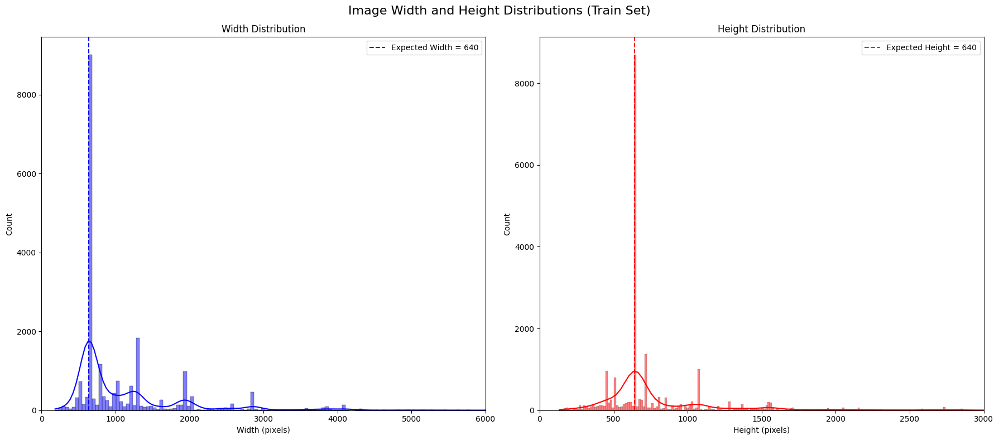

In [11]:
# Image Size and Resolution

plt.figure(figsize=(18, 8))

# Width distribution
plt.subplot(1, 2, 1)
sns.histplot(widths, color='blue', kde=True)
plt.axvline(640, color='blue', linestyle='--', label='Expected Width = 640')
plt.title('Width Distribution')
plt.xlabel('Width (pixels)')
plt.ylabel('Count')
plt.legend()
plt.xlim(0, 6000)

# Height distribution
plt.subplot(1, 2, 2)
sns.histplot(heights, color='red', kde=True)
plt.axvline(640, color='red', linestyle='--', label='Expected Height = 640')
plt.title('Height Distribution')
plt.xlabel('Height (pixels)')
plt.ylabel('Count')
plt.legend()
plt.xlim(0, 3000)

plt.suptitle('Image Width and Height Distributions (Train Set)', fontsize=16)
plt.tight_layout()
plt.show()

Observation:

* Majority of images are around 640×640
* Mostly Heights are smaller	than width
* There are images with very large widths and heights - Outliers
* Most of the images in 640×640 but many other resolutions are also present - Data imbalance
* **Uniform resizing will be needed for training YOLO effectively**



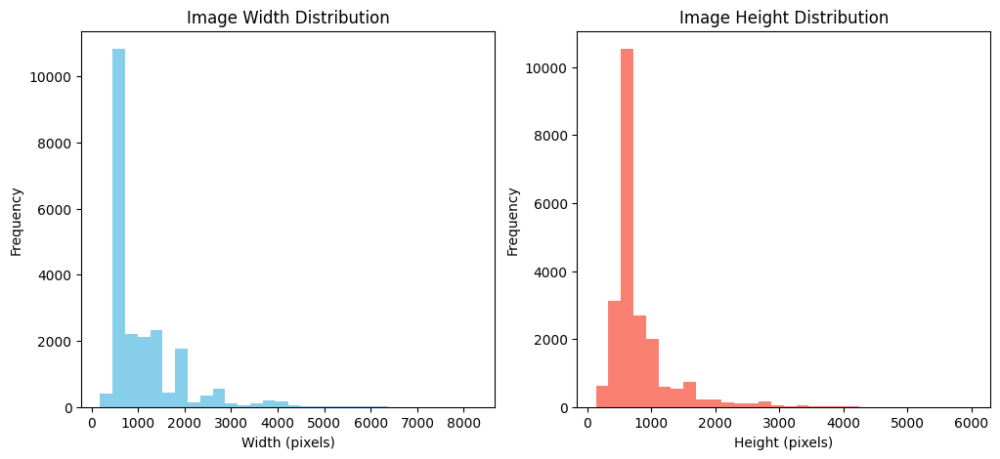

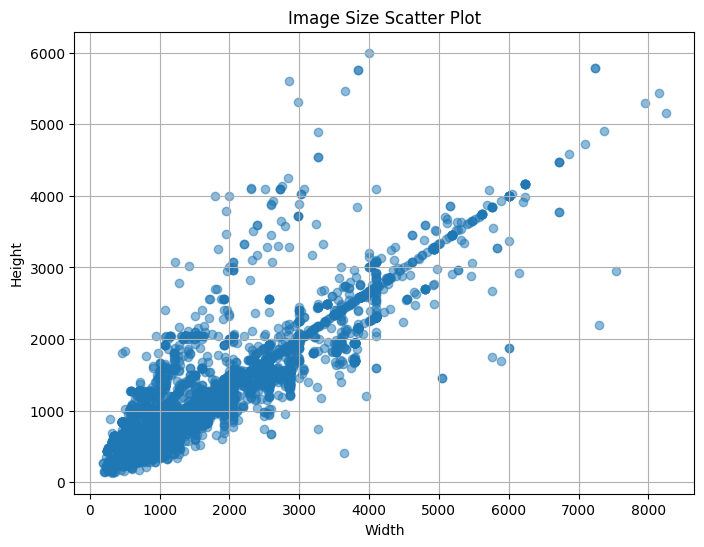

In [13]:
# Plot histograms
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.hist(widths, bins=30, color='skyblue')
plt.title("Image Width Distribution")
plt.xlabel("Width (pixels)")
plt.ylabel("Frequency")

plt.subplot(1,2,2)
plt.hist(heights, bins=30, color='salmon')
plt.title("Image Height Distribution")
plt.xlabel("Height (pixels)")
plt.ylabel("Frequency")

plt.show()

# Scatter plot to find outliers
plt.figure(figsize=(8,6))
plt.scatter(widths, heights, alpha=0.5)
plt.title("Image Size Scatter Plot")
plt.xlabel("Width")
plt.ylabel("Height")
plt.grid(True)
plt.show()

Observation:

* Most of the images have widths and heights between 500 and 1500 pixels.
* Have Outliers with larger image size upto 8000×6000 px.
* Clustered around standard input size (640×640) but with long tails in both axes

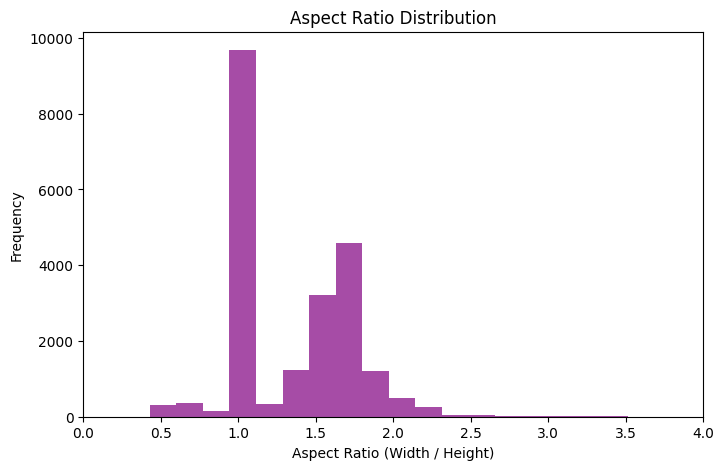

In [15]:
# Aspect Ratio - Examination the aspect ratio (width/height) of images

aspect_ratios = [w/h for w, h in zip(widths, heights)]

plt.figure(figsize=(8,5))
plt.hist(aspect_ratios, bins=50, color='purple', alpha=0.7)
plt.xlabel('Aspect Ratio (Width / Height)')
plt.ylabel('Frequency')
plt.xlim(0,4)
plt.title('Aspect Ratio Distribution')
plt.show()

Observation:

* More than half of the of images have aspect ratio of 1.0
* A significant portion has aspect ratios between 1.0 and 2.0
* Few outliers with Aspect ratios beyond 2.5

In [17]:
# Image Quality
def calculate_blurriness(image):
    laplacian_var = cv2.Laplacian(image, cv2.CV_64F).var()
    return laplacian_var
# calculate blurriness using Laplacian variance

def check_exposure(image):
    mean_intensity = np.mean(image)
    return mean_intensity

def calculate_entropy(image):
    hist = np.histogram(image, bins=256)[0]
    return entropy(hist + 1e-10)

# Lower entropy => Less texture (could be blurry or clean image)
# Higher entropy => Possible noise or high texture

In [20]:
# Lists to store quality metrics
blurriness_scores = []
brightness_levels = []
entropy_values = []

In [22]:
for filename in os.listdir(train_img_dir):
      path = os.path.join(train_img_dir, filename)

      image_gray = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

      blurriness = calculate_blurriness(image_gray)
      brightness = check_exposure(image_gray)
      ent = calculate_entropy(image_gray)

      blurriness_scores.append(blurriness)
      brightness_levels.append(brightness)
      entropy_values.append(ent)

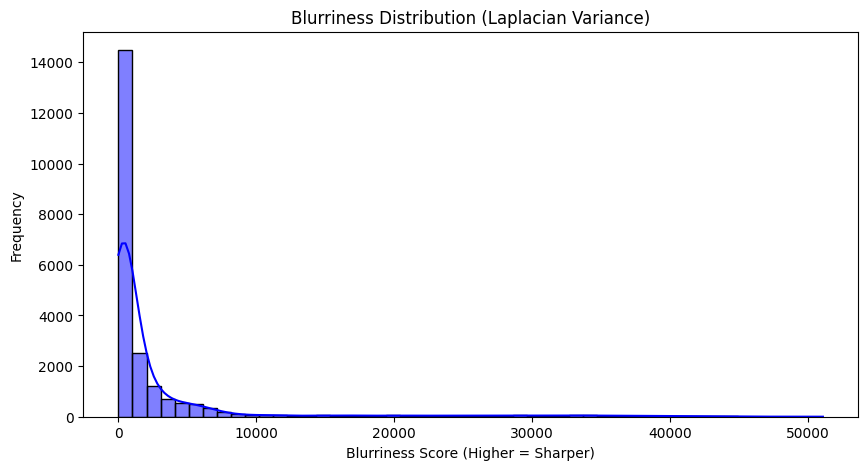

In [24]:
# Blurriness Distribution

plt.figure(figsize=(10,5))
sns.histplot(blurriness_scores, bins=50, color='blue', kde=True)
plt.title("Blurriness Distribution (Laplacian Variance)")
plt.xlabel("Blurriness Score (Higher = Sharper)")
plt.ylabel("Frequency")
plt.show()


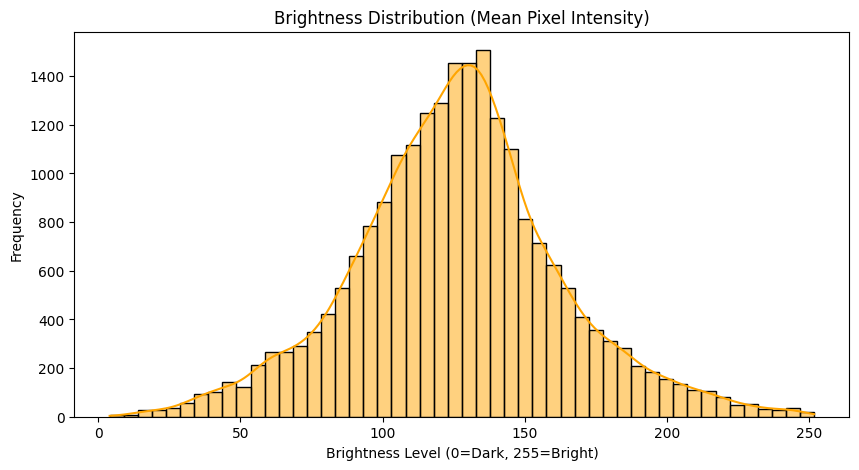

In [26]:
# Brightness Distribution
plt.figure(figsize=(10,5))
sns.histplot(brightness_levels, bins=50, color='orange', kde=True)
plt.title("Brightness Distribution (Mean Pixel Intensity)")
plt.xlabel("Brightness Level (0=Dark, 255=Bright)")
plt.ylabel("Frequency")
plt.show()

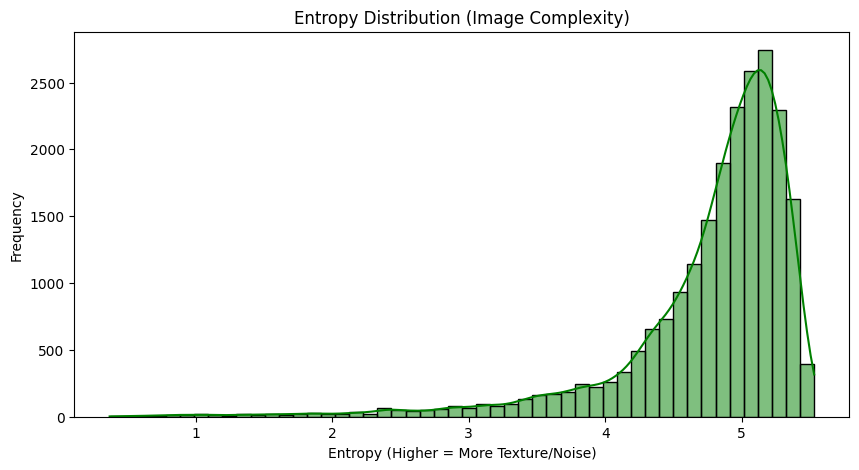

In [28]:
# Entropy Distribution
plt.figure(figsize=(10,5))
sns.histplot(entropy_values, bins=50, color='green', kde=True)
plt.title("Entropy Distribution (Image Complexity)")
plt.xlabel("Entropy (Higher = More Texture/Noise)")
plt.ylabel("Frequency")
plt.show()

Observations
* Blurriness
  - Heavily right-skewed
  - Many low-quality images	Filter images with Laplacian score < 200–300
  - Apply image sharpening filters during preprocessing
* Brightness
  - Very few images fall below 30 (very dark) or above 220
  - Mostly normal, centered around 130 - 140
  - Minimal preprocessing needed. But for edge devices or night scenes, consider brightness normalization
* Entropy
  - Entropy values are detail in the majority of images.
  - Very few low-complexity images
  - High entropy is generally beneficial for feature extraction — no significant cleaning needed
  

### **Annotation Analysis**


In [32]:
annotation_counts = []
bbox_relative_areas = []
bbox_aspect_ratios = []

label_files = [f for f in os.listdir(train_lbl_dir) if f.endswith('.txt')]

# Track images with no annotations
images_with_annotations = set([os.path.splitext(f)[0] for f in label_files])
all_images = [os.path.splitext(f)[0] for f in os.listdir(train_img_dir) if f.endswith(('.jpg', '.jpeg', '.png'))]
images_without_annotations = list(set(all_images) - images_with_annotations)

for lbl_file in label_files:
    path = os.path.join(train_lbl_dir, lbl_file)
    img_path = os.path.join(train_img_dir, lbl_file.replace('.txt', '.jpg'))

    # Read label file
    with open(path, 'r') as f:
        lines = f.readlines()
        annotation_counts.append(len(lines))

        for line in lines:
            parts = line.strip().split()
            if len(parts) == 5:
                class_id, x_center, y_center, width, height = map(float, parts)
                bbox_relative_areas.append(width * height)
                bbox_aspect_ratios.append(width / height if height != 0 else 0)

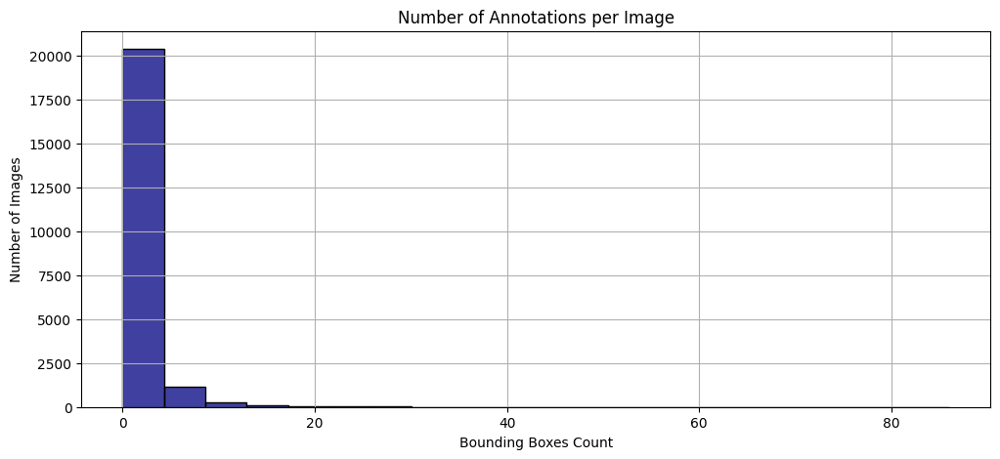

In [33]:
# Annotations per Image
plt.figure(figsize=(12, 5))
sns.histplot(annotation_counts, bins=20, kde=False, color='navy')
plt.title('Number of Annotations per Image')
plt.xlabel('Bounding Boxes Count')
plt.ylabel('Number of Images')
plt.grid(True)
plt.show()

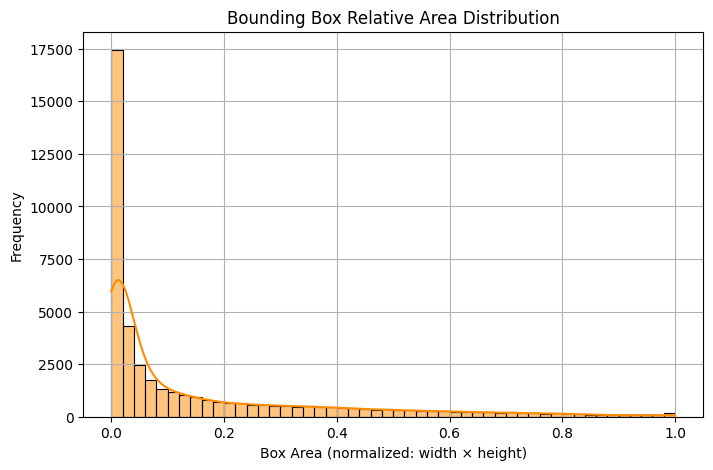

In [34]:
# Bounding Box Area Distribution
plt.figure(figsize=(8, 5))
sns.histplot(bbox_relative_areas, bins=50, kde=True, color='darkorange')
plt.title('Bounding Box Relative Area Distribution')
plt.xlabel('Box Area (normalized: width × height)')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

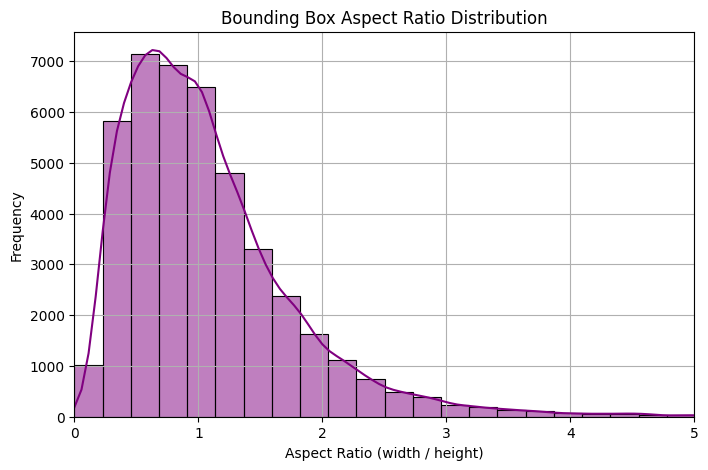

In [35]:
# Bounding Box Aspect Ratio
plt.figure(figsize=(8, 5))
sns.histplot(bbox_aspect_ratios, bins=50, kde=True, color='purple')
plt.title('Bounding Box Aspect Ratio Distribution')
plt.xlabel('Aspect Ratio (width / height)')
plt.ylabel('Frequency')
plt.grid(True)
plt.xlim(0, 5)
plt.show()

In [36]:
print(f"Total images: {len(all_images)}")
print(f"Images with no annotations: {len(images_without_annotations)}")

Total images: 21978
Images with no annotations: 0


Observations

* Number of Annotations per Image
  - Mostly 1–5 annotations per image; some images very dense (up to 80+ annotations)
  - Need to remove outliers to ensure label balance - Filter images with extremely high annotation counts if they dominate the batch distribution during training.
* Bounding Box Relative Area Distribution
  - Majority of bounding boxes have an area less than 0.05, indicating small objects.
  - Need to tune model for small object detection
* Bounding Box Aspect Ratio Distribution
  - Most boxes are approximately square as distribution peaks around aspect ratio 1.0
  - Use this aspect ratio distribution to optimize YOLO anchor boxes

### **Class Distribution**

In [7]:
class_names = {
    0: "camouflage_soldier",
    1: "weapon",
    2: "military_tank",
    3: "military_truck",
    4: "military_vehicle",
    5: "civilian",
    6: "soldier",
    7: "civilian_vehicle",
    8: "trench",
    9: "trench2",
    10: "Aircrafts",
    11: "Warship"
}

In [9]:
class_freq = Counter()
co_occurrence = defaultdict(set)

In [11]:
# Parse each label file
for lbl_file in os.listdir(train_lbl_dir):
    if not lbl_file.endswith('.txt'):
        continue
    path = os.path.join(train_lbl_dir, lbl_file)
    classes_in_img = set()
    with open(path, 'r') as f:
        for line in f:
            class_id = int(line.strip().split()[0])
            class_freq[class_id] += 1
            classes_in_img.add(class_id)
    # Store which classes appear together
    co_occurrence[lbl_file] = classes_in_img


In [12]:
# Convert to DataFrame for plotting
df_freq = pd.DataFrame({
    'Class ID': list(class_freq.keys()),
    'Frequency': list(class_freq.values()),
    'Class Name': [class_names[c] for c in class_freq.keys()]
}).sort_values(by="Frequency", ascending=False)


In [13]:
df_freq

,Class ID,Frequency,Class Name
1,2,17454,military_tank
10,10,7337,Aircrafts
2,6,6502,soldier
0,0,4477,camouflage_soldier
11,11,2134,Warship
3,4,1963,military_vehicle
5,3,1245,military_truck
4,1,1210,weapon
7,7,519,civilian_vehicle
8,8,439,trench


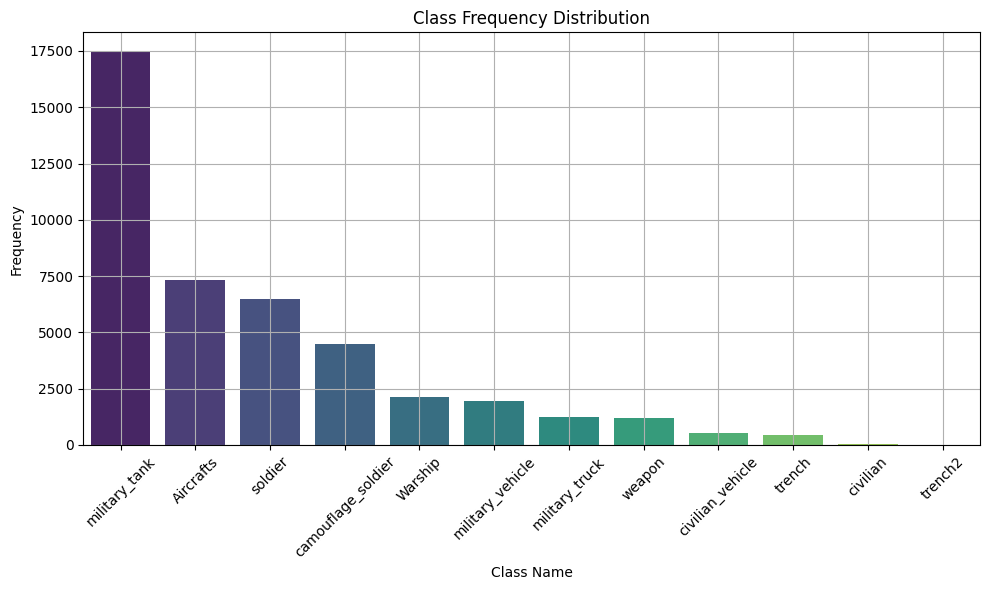

In [17]:
# --- Plot Class Frequency ---
plt.figure(figsize=(10,6))
sns.barplot(data=df_freq, x="Class Name", y="Frequency", hue="Class Name", palette="viridis", legend=False)
plt.title("Class Frequency Distribution")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()



Classes with very few images (<1000 images)
* civilian_vehicle
* trench
* trench2
* civilian

In [19]:
# --- Co-occurrence Matrix ---
# Create binary matrix: rows = images, cols = classes
class_ids = list(class_names.keys())
co_matrix = pd.DataFrame(0, index=co_occurrence.keys(), columns=class_ids)

for img_id, class_set in co_occurrence.items():
    for cls in class_set:
        co_matrix.loc[img_id, cls] = 1

# Calculate co-occurrence matrix (class × class)
co_matrix_sum = co_matrix.T.dot(co_matrix)

# Convert class IDs to names for plotting
co_matrix_sum.index = [class_names[i] for i in co_matrix_sum.index]
co_matrix_sum.columns = [class_names[i] for i in co_matrix_sum.columns]



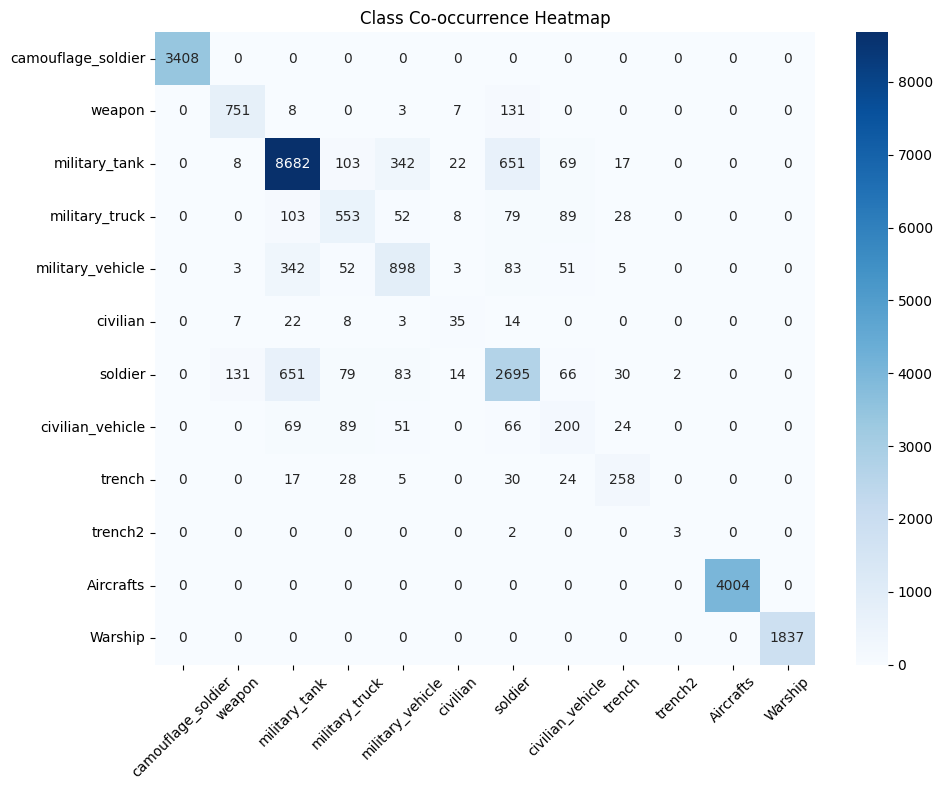

In [20]:
# --- Plot Heatmap ---
plt.figure(figsize=(10,8))
sns.heatmap(co_matrix_sum, annot=True, fmt='d', cmap='Blues')
plt.title("Class Co-occurrence Heatmap")
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

Observations

* Class Frequency Distribution
  - The most dominant class is military_tank
  - Underrepresented classes include:
   - civilian, civilian_vehicle, trench and weapon — each with <2000 instances
  - Need to apply data augmentation (flip, scale, rotate) for underrepresented classes.
  - Need to consider for class weighting or focal loss during training to avoid model bias toward over dominant classes.
  - Unknown classes needs to be mapped or cleaned for consistent labeling
* Class Co-occurrence Heatmap
  - Soldier and weapon, Military tank & soldier, Military tank & military vehicle co-occur frequently
  - Implement context-aware post-processing
  - Prioritize generating realistic scenes combining low-frequency co-classes

In [58]:
unknown_ids = {9, 10, 11}
unknown_class_images = []

for lbl_file in os.listdir(train_lbl_dir):
    if not lbl_file.endswith('.txt'):
        continue
    path = os.path.join(train_lbl_dir, lbl_file)
    with open(path, 'r') as f:
        for line in f:
            class_id = int(line.strip().split()[0])
            if class_id in unknown_ids:
                unknown_class_images.append(lbl_file.replace('.txt', '.jpg'))
                break  # One match is enough to flag the image


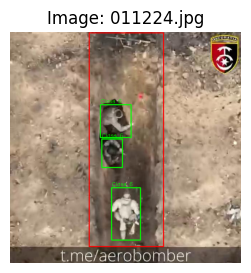

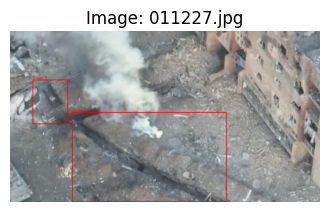

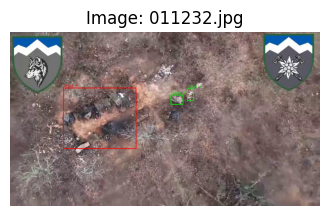

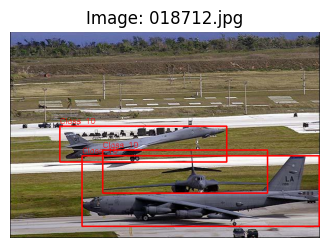

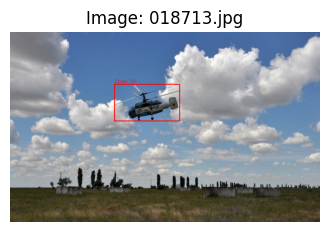

In [59]:
# Pick a few images to visualize
sample_unknowns = unknown_class_images[:5]  # View 5 examples

for img_file in sample_unknowns:
    img_path = os.path.join(train_img_dir, img_file)
    lbl_path = os.path.join(train_lbl_dir, img_file.replace('.jpg', '.txt'))

    image = cv2.imread(img_path)
    h, w = image.shape[:2]

    # Draw bounding boxes
    with open(lbl_path, 'r') as f:
        for line in f:
            parts = line.strip().split()
            class_id = int(parts[0])
            xc, yc, bw, bh = map(float, parts[1:])
            x1 = int((xc - bw/2) * w)
            y1 = int((yc - bh/2) * h)
            x2 = int((xc + bw/2) * w)
            y2 = int((yc + bh/2) * h)

            color = (0, 255, 0) if class_id not in unknown_ids else (0, 0, 255)
            label = f"Class {class_id}"
            cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
            cv2.putText(image, label, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

    # Convert BGR to RGB for matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(4,3))
    plt.imshow(image_rgb)
    plt.title(f"Image: {img_file}")
    plt.axis('off')
    plt.show()


In [62]:
unknown_ids = {9, 10, 11}
class_9_images = []
class_10_images = []
class_11_images =[]

for lbl_file in os.listdir(train_lbl_dir):
    if not lbl_file.endswith('.txt'):
        continue
    path = os.path.join(train_lbl_dir, lbl_file)
    with open(path, 'r') as f:
        for line in f:
            class_id = int(line.strip().split()[0])
            if class_id == 9:
                class_9_images.append(lbl_file.replace('.txt', '.jpg'))
                break
            elif class_id == 10:
                class_10_images.append(lbl_file.replace('.txt', '.jpg'))
                break
            elif class_id == 11:
                class_11_images.append(lbl_file.replace('.txt', '.jpg'))
                break

print(f"Found {len(class_9_images)} images with class 9.")
print(f"Found {len(class_10_images)} images with class 10.")
print(f"Found {len(class_11_images)} images with class 11.")


Found 3 images with class 9.
Found 4004 images with class 10.
Found 1837 images with class 11.


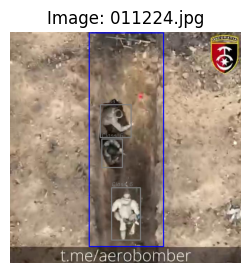

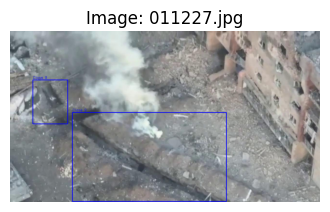

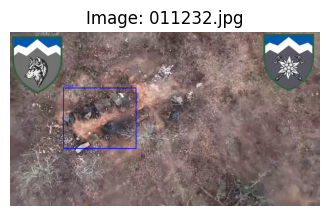

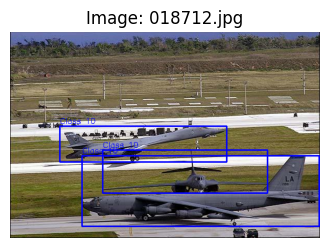

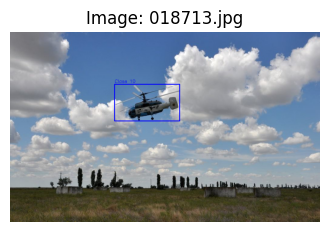

...

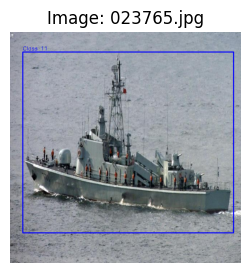

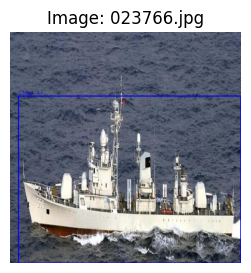

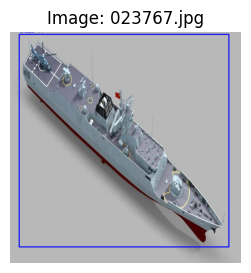

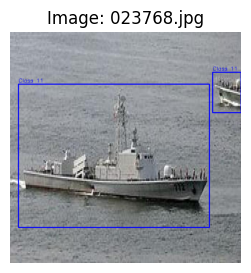

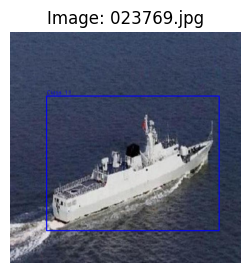

In [64]:
def preview_class_images(image_list, class_id, num=5):
    for img_file in image_list[:num]:
        img_path = os.path.join(train_img_dir, img_file)
        lbl_path = os.path.join(train_lbl_dir, img_file.replace('.jpg', '.txt'))

        image = cv2.imread(img_path)
        h, w = image.shape[:2]

        with open(lbl_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                cls_id = int(parts[0])
                xc, yc, bw, bh = map(float, parts[1:])
                x1 = int((xc - bw/2) * w)
                y1 = int((yc - bh/2) * h)
                x2 = int((xc + bw/2) * w)
                y2 = int((yc + bh/2) * h)
                color = (255, 0, 0) if cls_id == class_id else (128, 128, 128)
                cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
                cv2.putText(image, f"Class {cls_id}", (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(4,3))
        plt.imshow(image_rgb)
        plt.title(f"Image: {img_file}")
        plt.axis('off')
        plt.show()

# Show a few images from each
preview_class_images(class_9_images, 9)
preview_class_images(class_10_images, 10)
preview_class_images(class_11_images, 11)


Observation

* Class 9 seems to be Trench
* Class 10 seems to be Aircrafts
* Class 11 seems to be Warships 

In [7]:
# Count per class (image-level, not bbox-level)
class_image_counts = defaultdict(int)

# Go through all label files
for lbl_file in os.listdir(train_lbl_dir):
    if not lbl_file.endswith(".txt"):
        continue
    path = os.path.join(train_lbl_dir, lbl_file)

    classes_in_img = set()
    with open(path, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) >= 5:
                try:
                    class_id = int(float(parts[0]))  # handle "2.0" → 2
                    classes_in_img.add(class_id)
                except ValueError:
                    continue
    
    for cid in classes_in_img:
        class_image_counts[cid] += 1


In [9]:
# Print results
print("Images per class:")
for cid, count in sorted(class_image_counts.items()):
    print(f"Class {cid}: {count} images")

Images per class:
Class 0: 3408 images
Class 1: 751 images
Class 2: 8682 images
Class 3: 553 images
Class 4: 898 images
Class 5: 35 images
Class 6: 2695 images
Class 7: 200 images
Class 8: 258 images
Class 9: 3 images
Class 10: 4004 images
Class 11: 1837 images


### **Visualization**

In [120]:
def visualize_sample_annotations(image_dir, label_dir, class_names, target_classes, num_samples=10):


    image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
    displayed = 0

    for img_file in image_files:
        if displayed >= num_samples:
            break

        img_path = os.path.join(image_dir, img_file)
        lbl_path = os.path.join(label_dir, img_file.replace('.jpg', '.txt').replace('.png', '.txt').replace('.jpeg', '.txt'))

        if not os.path.exists(lbl_path):
            continue

        show_image = False
        boxes = []

        with open(lbl_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                cls_id, xc, yc, bw, bh = map(float, parts[:5])
                cls_name = class_names[int(cls_id)]
                boxes.append((cls_id, xc, yc, bw, bh))

                if cls_name in target_classes:
                    show_image = True

        if show_image:
            image = cv2.imread(img_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            h, w = image.shape[:2]

            for cls_id, xc, yc, bw, bh in boxes:
                x1 = int((xc - bw/2) * w)
                y1 = int((yc - bh/2) * h)
                x2 = int((xc + bw/2) * w)
                y2 = int((yc + bh/2) * h)

                color = (0, 255, 0) if class_names[int(cls_id)] in target_classes else (255, 0, 0)
                label = class_names[int(cls_id)]
                cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
                cv2.putText(image, label, (x1, y1-5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

            plt.figure(figsize=(5,5))
            plt.imshow(image)
            plt.axis('off')
            plt.title(f"Image: {img_file}")
            plt.show()

            displayed += 1


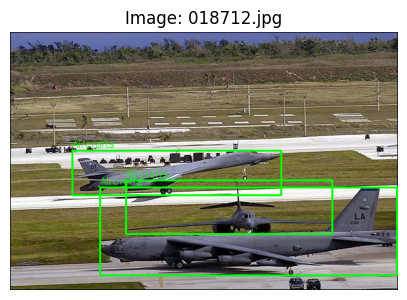

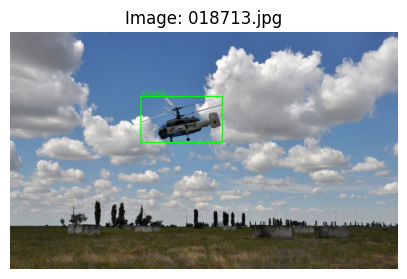

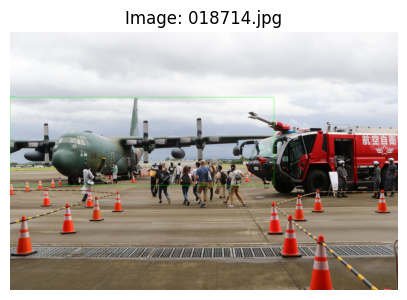

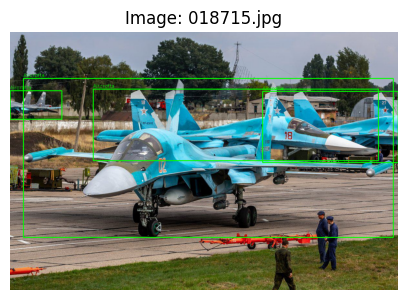

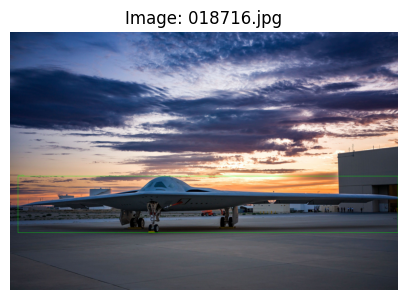

In [128]:
visualize_sample_annotations(train_img_dir, train_lbl_dir, class_names, "Aircrafts", num_samples=5)

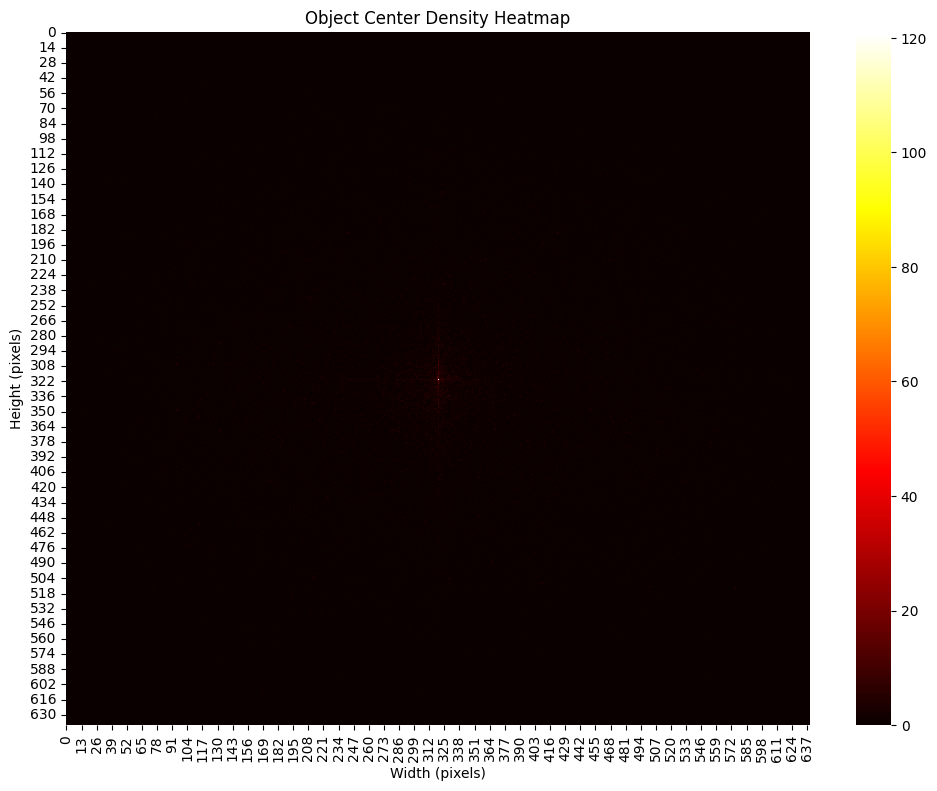

In [172]:
heatmap = np.zeros((640, 640))

for lbl_file in os.listdir(train_lbl_dir):
    if not lbl_file.endswith('.txt'):
        continue
    with open(os.path.join(train_lbl_dir, lbl_file), 'r') as f:
        for line in f:
            parts = line.strip().split()
            xc, yc = map(float, parts[1:3])
            px = int(xc * 640)
            py = int(yc * 640)
            heatmap[py, px] += 1

plt.figure(figsize=(12,9))
sns.heatmap(heatmap, cmap="hot")
plt.title("Object Center Density Heatmap")
plt.xlabel("Width (pixels)")
plt.ylabel("Height (pixels)")
plt.show()

In [173]:
bbox_sizes = {cls: [] for cls in class_names.values()}

for lbl_file in os.listdir(train_lbl_dir):
    if not lbl_file.endswith('.txt'):
        continue
    with open(os.path.join(train_lbl_dir, lbl_file), 'r') as f:
        for line in f:
            parts = line.strip().split()
            cls_id, _, _, w, h = map(float, parts[:5])
            area = w * h
            bbox_sizes[class_names[int(cls_id)]].append(area)



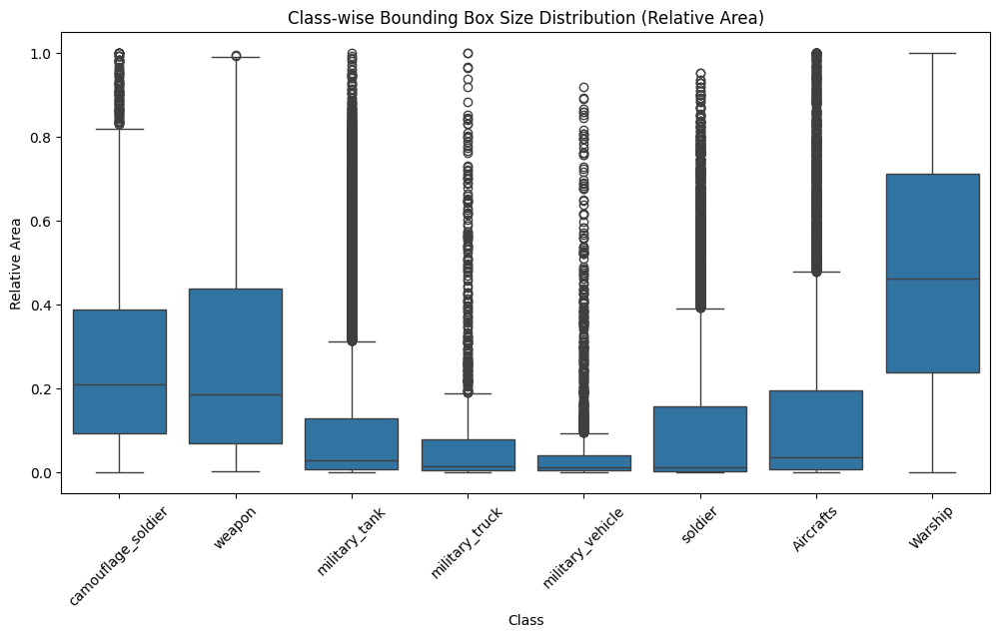

In [174]:
# Convert to DataFrame
bbox_data = []
for cls, sizes in bbox_sizes.items():
    for s in sizes:
        bbox_data.append({'Class': cls, 'Relative Area': s})

df_bbox = pd.DataFrame(bbox_data)

# Plot
plt.figure(figsize=(12,6))
sns.boxplot(data=df_bbox, x="Class", y="Relative Area")
plt.xticks(rotation=45)
plt.title("Class-wise Bounding Box Size Distribution (Relative Area)")
plt.show()


Observations

| **Class**              | **Median Size**            | **Spread** | **Outliers**                 | **Interpretation / Notes**                                                                    |
| ---------------------- | -------------------------- | ---------- | ---------------------------- | --------------------------------------------------------------------------------------------- |
| **Camouflage Soldier** | Moderate (/~0.2)           | Wide       | Many high outliers           | Wide scale variation; possibly mixed zoom levels or inconsistent labeling.                    |
| **Weapon**             | Moderate (\\~0.15–0.2)      | Wide       | Large bounding boxes present | Includes both small firearms and large weapons/cargo. Labeling consistency should be checked. |
| **Military Tank**      | Small (\\~0.03)             | Narrow     | Numerous high outliers       | Mostly seen from a distance; outliers may be zoomed or cropped views.                         |
| **Military Truck**     | Small to Moderate (\\~0.05) | Consistent | Few outliers                 | Generally uniform in scale; model may learn well with fewer augmentations.                    |
| **Military Vehicle**   | Small (\\~0.05)             | Moderate   | Some scattered outliers      | Distance-based variability; difficult to distinguish from trucks or tanks if unannotated.     |
| **Soldier**            | Small (\\~0.1)              | Moderate   | Some large outliers          | Variations could be due to zoom or groups of people detected together.                        |
| **Aircrafts**          | Medium (\\~0.15–0.2)        | Wide       | Significant variation        | Detected at different altitudes/perspectives. Anchors need to support wide range.             |
| **Warship**            | Large (\\~0.45)             | Wide       | Few outliers                 | Dominantly large and easier to detect; may dominate loss without class balancing.             |



Insights & Recommendations
* Small object detection (tank, soldier, vehicle, weapon) remains a challenge. Consider:

    - Higher image resolution (e.g., imgsz=768)

    - Use of YOLOv8’s auto_augment with randaugment

    - Tuning anchor boxes (model.tune_anchors() if using custom training loops)

* Class-wise augmentation may help underrepresented or small-scale classes (e.g., soldier, military_truck).

* Outlier control: Review label consistency especially in classes like weapon, trench, camouflage_soldier.

* Model capacity: Consider YOLOv8m or YOLOv8l if training with balanced resources and full dataset, especially due to the variation in object scale.



### **Dataset Splits**

In [140]:
# Class Distribution per Split

def get_class_distribution(label_dir):
    counts = Counter()
    for file in os.listdir(label_dir):
        if not file.endswith('.txt'): continue
        with open(os.path.join(label_dir, file), 'r') as f:
            for line in f:
                class_id = int(line.strip().split()[0])
                counts[class_id] += 1
    return counts


In [142]:
train_counts = get_class_distribution(train_lbl_dir)
val_counts = get_class_distribution(val_lbl_dir)
test_counts = get_class_distribution(test_lbl_dir)

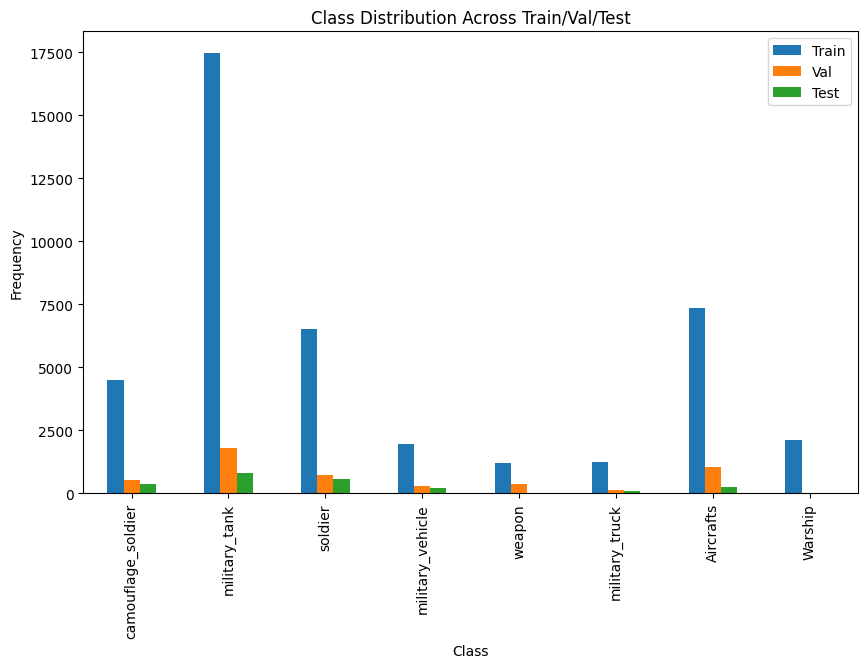

In [143]:

# Convert to DataFrame
df = pd.DataFrame({
    'Class': [class_names[c] for c in train_counts.keys()],
    'Train': list(train_counts.values()),
    'Val': [val_counts[c] for c in train_counts.keys()],
    'Test': [test_counts[c] for c in train_counts.keys()],
})

df.set_index('Class').plot(kind='bar', figsize=(10,6))
plt.title("Class Distribution Across Train/Val/Test")
plt.ylabel("Frequency")
plt.show()


In [144]:
# Bounding Box Size Comparison function
def get_bbox_areas(label_dir):
    areas = []
    for file in os.listdir(label_dir):
        if not file.endswith('.txt'): continue
        with open(os.path.join(label_dir, file), 'r') as f:
            for line in f:
                parts = list(map(float, line.strip().split()))
                _, _, _, w, h = parts[:5]
                areas.append(w * h)
    return areas


In [147]:
train_areas = get_bbox_areas(train_lbl_dir)
val_areas = get_bbox_areas(val_lbl_dir)
test_areas = get_bbox_areas(test_lbl_dir)


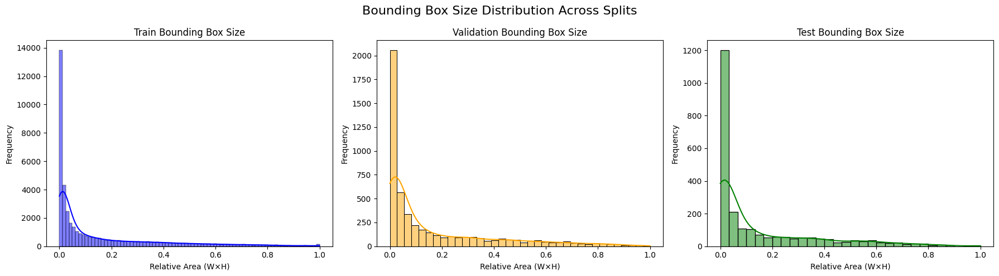

In [148]:

plt.figure(figsize=(18,5))

# Train
plt.subplot(1,3,1)
sns.histplot(train_areas, color='blue', kde=True)
plt.title("Train Bounding Box Size")
plt.xlabel("Relative Area (W×H)")
plt.ylabel("Frequency")

# Validation
plt.subplot(1,3,2)
sns.histplot(val_areas, color='orange', kde=True)
plt.title("Validation Bounding Box Size")
plt.xlabel("Relative Area (W×H)")
plt.ylabel("Frequency")

# Test
plt.subplot(1,3,3)
sns.histplot(test_areas, color='green', kde=True)
plt.title("Test Bounding Box Size")
plt.xlabel("Relative Area (W×H)")
plt.ylabel("Frequency")

plt.suptitle("Bounding Box Size Distribution Across Splits", fontsize=16)
plt.tight_layout()
plt.show()

In [151]:
# Annotation Density Check function

def get_annotation_counts(label_dir):
    counts = []
    for file in os.listdir(label_dir):
        if not file.endswith('.txt'): continue
        with open(os.path.join(label_dir, file), 'r') as f:
            lines = f.readlines()
            counts.append(len(lines))
    return counts


In [152]:
# Annotations for each splits
train_ann = get_annotation_counts(train_lbl_dir)
val_ann = get_annotation_counts(val_lbl_dir)
test_ann = get_annotation_counts(test_lbl_dir)


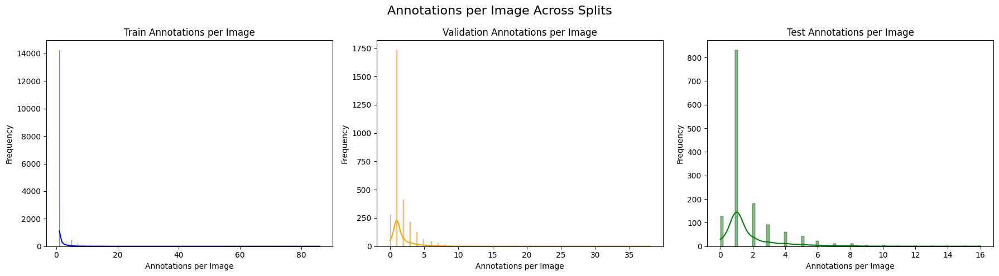

In [153]:
# Plot for anotations per image accross splits
plt.figure(figsize=(18,5))

# Train
plt.subplot(1,3,1)
sns.histplot(train_ann, color='blue', kde=True)
plt.title("Train Annotations per Image")
plt.xlabel("Annotations per Image")
plt.ylabel("Frequency")

# Validation
plt.subplot(1,3,2)
sns.histplot(val_ann, color='orange', kde=True)
plt.title("Validation Annotations per Image")
plt.xlabel("Annotations per Image")
plt.ylabel("Frequency")

# Test
plt.subplot(1,3,3)
sns.histplot(test_ann, color='green', kde=True)
plt.title("Test Annotations per Image")
plt.xlabel("Annotations per Image")
plt.ylabel("Frequency")

plt.suptitle("Annotations per Image Across Splits", fontsize=16)
plt.tight_layout()
plt.show()


In [156]:
# Data Leakage Check

def get_hashes(image_dir):
    hashes = {}
    for img in os.listdir(image_dir):
        if img.endswith(('.jpg', '.png')):
            path = os.path.join(image_dir, img)
            img_hash = imagehash.phash(Image.open(path))
            hashes[img] = img_hash
    return hashes



In [158]:

train_hashes = get_hashes(train_img_dir)
test_hashes = get_hashes(test_img_dir)


C:\Users\yuges\anaconda3\Lib\site-packages\PIL\Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


In [160]:
# Compare hashes
duplicates = []
for t_img, t_hash in test_hashes.items():
    for tr_img, tr_hash in train_hashes.items():
        if t_hash - tr_hash < 5:  # Hamming distance threshold
            duplicates.append((t_img, tr_img))

print(f"Possible data leakage: {len(duplicates)} duplicate/near-duplicate images found between train & test.")

Possible data leakage: 1123 duplicate/near-duplicate images found between train & test.


Observations:
- **Severe class imbalance**, with military_tank dominating and weapon, military_truck, military_vehicle, etc., underrepresented.
- **Most bounding boxes are small**, highlighting a need for small object detection tuning.
- **Train set includes extreme annotation outliers** with over 80 boxes in some images.
- **1123 near-duplicate images detected between train and test**, posing a serious data leakage risk.

Recommendations:
- Apply **targeted augmentation** for rare classes and use **focal loss or class weights** during training.
- **Enable high-resolution input and anchor tuning** for improved small object detection.
- **Remove or downsample over-annotated images** to balance training batches.
- **Clean up duplicated images** to avoid data leakage and re-evaluate the model with a clean test set.


In [168]:
# Removing duplicates from the train directory

removed_count = 0

for test_img, train_img in duplicates:
    train_path = os.path.join(train_img_dir, train_img)
    if os.path.exists(train_path):
        os.remove(train_path)
        removed_count += 1
        print(f"🗑️ Removed duplicate training image: {train_img}")

print(f"\nRemoved {removed_count} duplicate/near-duplicate training images.")

🗑️ Removed duplicate training image: 000136.jpg
🗑️ Removed duplicate training image: 002133.jpg
🗑️ Removed duplicate training image: 002135.jpg
🗑️ Removed duplicate training image: 003052.jpg
🗑️ Removed duplicate training image: 003546.jpg
🗑️ Removed duplicate training image: 003053.jpg
🗑️ Removed duplicate training image: 000193.jpg
🗑️ Removed duplicate training image: 000199.jpg
🗑️ Removed duplicate training image: 000200.jpg
🗑️ Removed duplicate training image: 003056.jpg
🗑️ Removed duplicate training image: 003065.jpg
🗑️ Removed duplicate training image: 003067.jpg
🗑️ Removed duplicate training image: 003068.jpg
🗑️ Removed duplicate training image: 003070.jpg
🗑️ Removed duplicate training image: 003077.jpg
🗑️ Removed duplicate training image: 003117.jpg
🗑️ Removed duplicate training image: 003152.jpg
🗑️ Removed duplicate training image: 003174.jpg
🗑️ Removed duplicate training image: 003201.jpg
🗑️ Removed duplicate training image: 003212.jpg
🗑️ Removed duplicate training image: 003

In [170]:
# Removing corresponding label files

for _, train_img in duplicates:
    base_name = os.path.splitext(train_img)[0]
    label_path = os.path.join(train_lbl_dir, base_name + ".txt")
    if os.path.exists(label_path):
        os.remove(label_path)
        print(f"🗑️ Removed label: {base_name}.txt")


🗑️ Removed label: 000136.txt
🗑️ Removed label: 002133.txt
🗑️ Removed label: 002135.txt
🗑️ Removed label: 003052.txt
🗑️ Removed label: 003546.txt
🗑️ Removed label: 003053.txt
🗑️ Removed label: 000193.txt
🗑️ Removed label: 000199.txt
🗑️ Removed label: 000200.txt
🗑️ Removed label: 003056.txt
🗑️ Removed label: 003065.txt
🗑️ Removed label: 003067.txt
🗑️ Removed label: 003068.txt
🗑️ Removed label: 003070.txt
🗑️ Removed label: 003077.txt
🗑️ Removed label: 003117.txt
🗑️ Removed label: 003152.txt
🗑️ Removed label: 003174.txt
🗑️ Removed label: 003201.txt
🗑️ Removed label: 003212.txt
🗑️ Removed label: 003216.txt
🗑️ Removed label: 003228.txt
🗑️ Removed label: 003266.txt
🗑️ Removed label: 003267.txt
🗑️ Removed label: 003274.txt
🗑️ Removed label: 003280.txt
🗑️ Removed label: 003286.txt
🗑️ Removed label: 003290.txt
🗑️ Removed label: 005724.txt
🗑️ Removed label: 005725.txt
🗑️ Removed label: 003356.txt
🗑️ Removed label: 003388.txt
🗑️ Removed label: 003402.txt
🗑️ Removed label: 003404.txt
🗑️ Removed lab

### **Data Augmentation Analysis**

In [48]:
def load_image_and_labels(image_path, label_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    h, w = image.shape[:2]

    bboxes = []
    class_labels = []
    with open(label_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            cls_id, xc, yc, bw, bh = map(float, parts)
            bboxes.append([xc, yc, bw, bh])
            class_labels.append(int(cls_id))
    return image, bboxes, class_labels


In [50]:
transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.3),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=15, p=0.5),
    A.RandomSizedBBoxSafeCrop(640, 640, erosion_rate=0.2, p=0.5),  # Safe crop for small objects
],
bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))


C:\Users\yuges\anaconda3\Lib\site-packages\albumentations\core\validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


In [52]:
def visualize_aug(image, bboxes, class_labels, class_names, transform):
    augmented = transform(image=image, bboxes=bboxes, class_labels=class_labels)
    aug_image = augmented["image"]
    aug_bboxes = augmented["bboxes"]
    aug_labels = augmented["class_labels"]

    fig, axs = plt.subplots(1,2, figsize=(12,6))

    # Original
    axs[0].imshow(image)
    axs[0].set_title("Original")
    h, w = image.shape[:2]
    for bbox, label in zip(bboxes, class_labels):
        xc, yc, bw, bh = bbox
        x1 = int((xc - bw/2) * w)
        y1 = int((yc - bh/2) * h)
        x2 = int((xc + bw/2) * w)
        y2 = int((yc + bh/2) * h)
        axs[0].add_patch(plt.Rectangle((x1,y1), x2-x1, y2-y1, edgecolor="lime", facecolor="none", linewidth=2))
        axs[0].text(x1, y1-5, class_names[label], color="white", fontsize=8, bbox=dict(facecolor="black", alpha=0.5))

    # Augmented
    axs[1].imshow(aug_image)
    axs[1].set_title("Augmented")
    h, w = aug_image.shape[:2]
    for bbox, label in zip(aug_bboxes, aug_labels):
        xc, yc, bw, bh = bbox
        x1 = int((xc - bw/2) * w)
        y1 = int((yc - bh/2) * h)
        x2 = int((xc + bw/2) * w)
        y2 = int((yc + bh/2) * h)
        axs[1].add_patch(plt.Rectangle((x1,y1), x2-x1, y2-y1, edgecolor="red", facecolor="none", linewidth=2))
        axs[1].text(x1, y1-5, class_names[label], color="white", fontsize=8, bbox=dict(facecolor="black", alpha=0.5))

    plt.show()


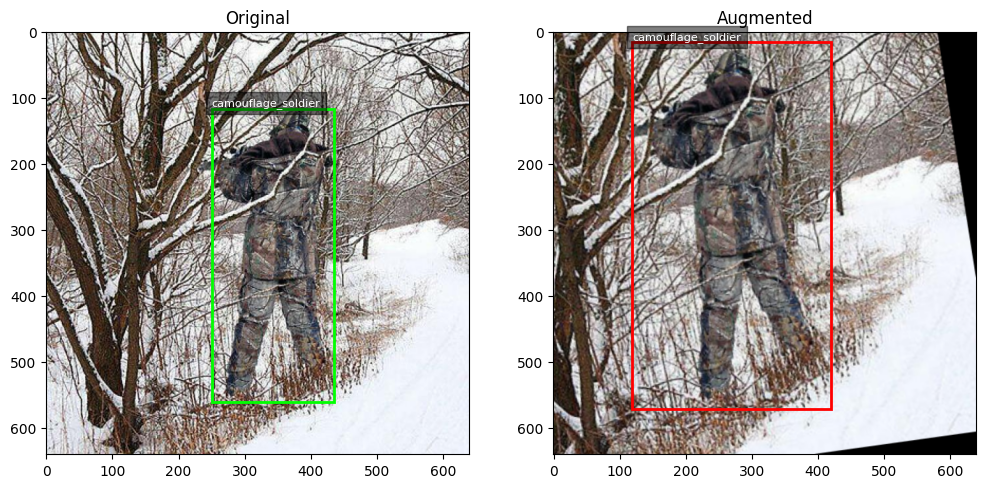

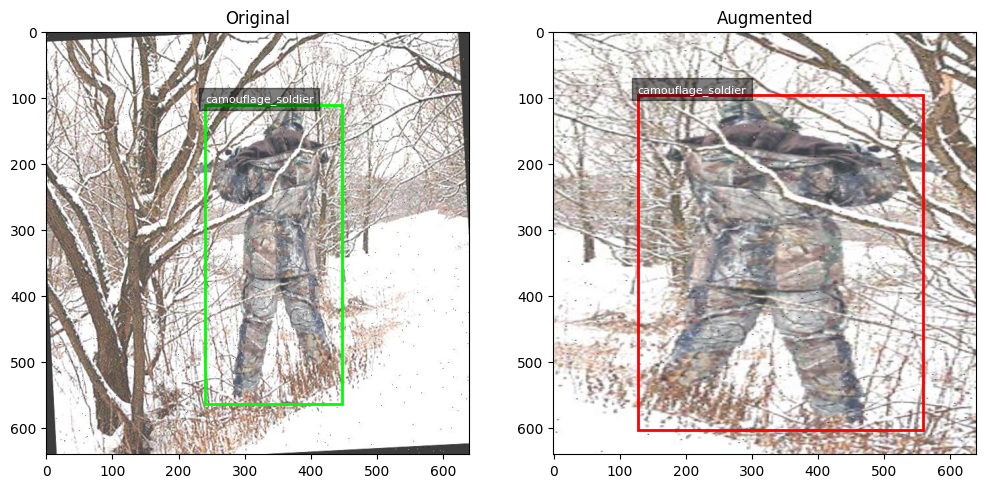

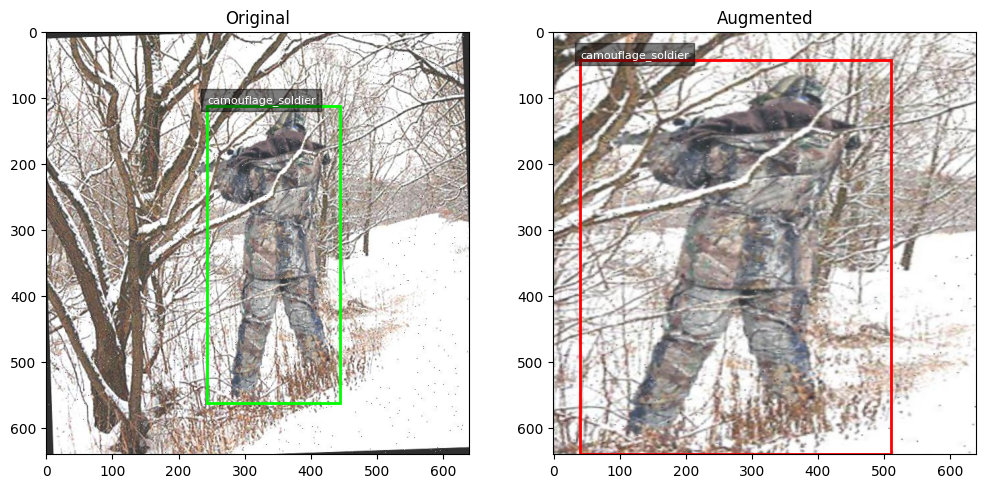

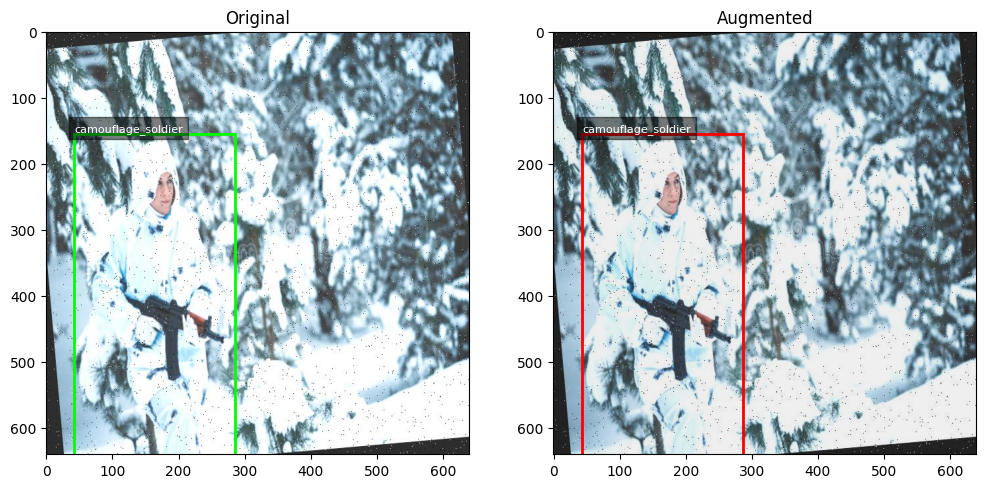

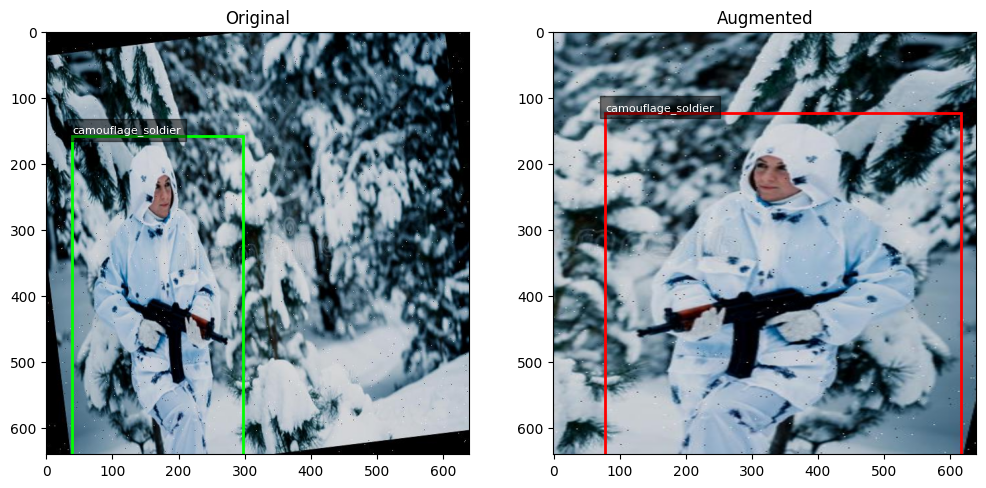

In [54]:
for img_file in os.listdir(train_img_dir)[:5]:
    img_path = os.path.join(train_img_dir, img_file)
    lbl_path = os.path.join(train_lbl_dir, img_file.replace(".jpg", ".txt"))

    image, bboxes, labels = load_image_and_labels(img_path, lbl_path)
    visualize_aug(image, bboxes, labels, class_names, transform)

**Transformations Applied:**
- Horizontal Flip
- Brightness/Contrast Adjustment
- Shift/Scale/Rotate
- Random Safe Crop (preserving YOLO boxes)

**Observations:**
- Object integrity and labels are preserved.
- Augmented bounding boxes align accurately.
- Visual diversity improves generalization.

**Next Recommendations:**
- Add more augmentations (e.g., blur, fog, hue shifts).
- Emphasize augmentation on underrepresented classes (e.g., civilian, trench).
- Tune cropping for small object retention.


##**Challenges, Insights & Recommendations**

Must-Have Recommendations (Critical for Model Success)

---

1. Class Imbalance
- Issue: military_tank dominates the dataset, while classes like civilian, weapon, trench, etc., are underrepresented.
-**Recommendations**:
  - Apply targeted augmentation to rare classes.
  - Use **class weights** or **focal loss** to reduce model bias during training.

---

2. Small Object Detection
- Issue: Majority of bounding boxes are very small (relative area < 0.05).
-**Recommendations**:
  - Increase input image size to **768×768** or **960×960**.
  - Use **multi-scale training**.
  - Tune **YOLO anchor boxes** with k-means clustering based on bbox dimensions.

---

### 3. Annotation Quality
-Issue: Noisy labels like class 9, 10, 11 found; images with no annotations.
-**Actions Taken**:
  - Removed invalid class annotations.
  - Deleted unannotated images and empty label files.
-**Recommendations**:
  - Perform spot checks using **LabelImg** or **CVAT**.
  - Regularly verify bbox overlaps, label accuracy, and missing boxes.

---

### 4. Data Leakage
-Issue: 1113 near-duplicate images found between train and test sets.
- **Recommendation**:
  - Remove these from the training set **before training** to avoid inflated metrics.
  - Re-evaluate model performance after cleanup.

---

### 5. Data Augmentation
-Applied: Horizontal Flip, Brightness, Safe Crop, Rotation
- **Recommendations**:
  - Add more transformations: HueSaturationValue, RandomFog, Cutout, MotionBlur
  - Focus on **bbox-safe augmentations** to retain label accuracy.
  - Augment more aggressively for underrepresented or small-object classes.

---

### 6. Evaluation Metrics
-Use:
  - Precision, Recall
  - **mAP@0.5**, **mAP@[.5:.95]**
- Generate per-class breakdown to diagnose weak detection areas.

---

## Optional (Advanced) Recommendations

| Area                    | Recommendation                                                              |
|-------------------------|-------------------------------------------------------------------------------|
| Contextual Co-occurrence | Use class co-occurrence logic (e.g., soldier + weapon = threat) in post-processing |
| Threat Score Classification | Classify images into "threat" vs "non-threat" based on object context        |
| Edge Deployment         | Use YOLOv5n/YOLOv8n and convert to ONNX or TFLite for fast inference      |
| Annotation Tools        | Use CVAT or Roboflow for manual re-annotation and correction                 |
| Dataset Versioning      | Maintain organized folder/version structure using DVC or Git for reproducibility |

---

### Conclusion:
> Addressing small object detection, class imbalance, and annotation quality is **crucial** for achieving high performance in YOLO-based military threat detection systems.


## **Questions to be Answered (OpenCV + YOLO Computer Vision)**

### How can we preprocess the dataset to ensure optimal performance during YOLO training?

**Preprocessing Techniques**:
- **Resize images** to a consistent size (e.g., 640×640 or 960×960) as YOLO expects fixed input dimensions.
- **Normalize annotations** to YOLO format: `class_id x_center y_center width height` (values between 0–1).
- **Remove noise**:
  - Delete images with no labels.
  - Remove unknown class labels (e.g., classes 9–11 in this dataset).
- **Augment data** using `albumentations`:
  - Apply `flip`, `rotate`, `scale`, `brightness`, `blur`, `cutout`, etc., with bbox-safe transformations.
- **Tune class balance**:
  - Apply oversampling/augmentation to underrepresented classes.

---

### What YOLO model architecture is best suited for detecting small objects like weapons?

**Recommended Architectures**:
- **YOLOv5m or YOLOv8m**: Balanced performance for both large and small objects.
- **YOLOv8n**: Lightweight and efficient on edge devices, but slightly lower accuracy.
- **YOLOv7-tiny or YOLO-NAS-Small**: Excellent accuracy and speed for small objects with lower resource consumption.

🔧 **Enhancements for Small Object Detection**:
- Increase input resolution (e.g., 896×896).
- Customize **anchor boxes** using `k-means` clustering on bounding boxes.
- Enable **multi-scale training** to expose model to objects at various scales.
- Ensure **no image downsampling** during preprocessing if small objects dominate.

---

### How can we improve the model's accuracy in distinguishing between military and civilian entities?

**Techniques to Improve Discrimination**:
- Use **contextual class augmentation**:
  - Train the model with images that clearly show mixed civilian-military settings.
- Use **class co-occurrence information**:
  - Soldiers often co-occur with weapons, civilians do not — leverage this in post-processing.
- Apply **class balancing techniques**:
  - Oversample civilian/civilian_vehicle classes.
- Use **domain-specific augmentations**:
  - Blur or distort images to simulate real-world drone/surveillance scenarios.
- If needed, add a second-level **classifier** for threat vs non-threat after detection.

---

### What post-processing techniques can be applied to enhance detection results?

**Recommended Post-Processing Methods**:
- **Non-Max Suppression (NMS)**:
  - Already part of YOLO; tweak IoU thresholds (e.g., lower it for crowded scenes).
- **Class-aware NMS**:
  - Helps avoid suppressing true detections when multiple classes are nearby.
- **Confidence threshold tuning**:
  - Adjust confidence level (e.g., 0.25–0.4) to reduce false positives.
- **Contextual filtering**:
  - Add logic: If object is detected as civilian + weapon, raise threat alert.
- **Heatmaps / Attention visualization**:
  - Useful for explainability and operator trust in model predictions.

---

### How can the system be integrated into real-time applications for military use?

**Integration Strategy**:
- **YOLO Inference Pipeline**:
  - Load YOLO model via Ultralytics or ONNX.
  - Process live frames from camera feeds using OpenCV.
- **Streamlit or Flask App** (for demo):
  - Upload image/video, show detections, allow download.
- **Edge Device Compatibility**:
  - Use YOLOv5/8 with **ONNX or TensorRT** for fast inference on:
    - Jetson Nano / Xavier
    - Raspberry Pi (with Coral USB accelerator)
- **Threat Alert Module**:
  - If weapon or unknown military vehicle detected → trigger alert (via UI or command center).
- **Scalability**:
  - Deploy with video stream processing frameworks like **GStreamer**, **Kafka**, or **RTSP pipelines**.

---



## **Data Preprocessing**

In [11]:
valid_classes = {0, 2, 6, 10, 11}  # Keep only classes with minimum of 2000 images
removed_count = 0
empty_files_deleted = 0

In [13]:
for filename in os.listdir(train_lbl_dir):
    if not filename.endswith('.txt'):
        continue
    file_path = os.path.join(train_lbl_dir, filename)

    with open(file_path, 'r') as f:
        lines = f.readlines()

    # Filter only valid class annotations
    filtered_lines = [line for line in lines if int(line.split()[0]) in valid_classes]

    if not filtered_lines:
        os.remove(file_path)
        empty_files_deleted += 1
    else:
        with open(file_path, 'w') as f:
            f.writelines(filtered_lines)

    removed_count += len(lines) - len(filtered_lines)

print(f"Removed {removed_count} annotations from unwanted classes (1, 3, 4, 5, 7, 8, 9).")
print(f"Deleted {empty_files_deleted} label files that had no valid annotations left.")

Removed 5432 annotations from unwanted classes (1, 3, 4, 5, 7, 8, 9).
Deleted 2003 label files that had no valid annotations left.


In [14]:
# Removing Images with no annotations

deleted_images = 0

for image_file in os.listdir(train_img_dir):
    if not image_file.lower().endswith(('.jpg', '.jpeg', '.png')):
        continue

    base_name = os.path.splitext(image_file)[0]
    label_path = os.path.join(train_lbl_dir, base_name + '.txt')

    if not os.path.exists(label_path):
        # No label file → remove the image
        os.remove(os.path.join(train_img_dir, image_file))
        deleted_images += 1

print(f"Deleted {deleted_images} unannotated images from: {train_img_dir}")


Deleted 2003 unannotated images from: C:/Users/yuges/Desktop/Data Science/Final Project/military_object_dataset/train/images


In [17]:
removed_count_test = 0
empty_files_deleted_test = 0

In [19]:
for filename in os.listdir(test_lbl_dir):
    if not filename.endswith('.txt'):
        continue
    file_path = os.path.join(test_lbl_dir, filename)

    with open(file_path, 'r') as f:
        lines = f.readlines()

    # Filter only valid class annotations
    filtered_lines = [line for line in lines if int(line.split()[0]) in valid_classes]

    if not filtered_lines:
        os.remove(file_path)
        empty_files_deleted_test += 1
    else:
        with open(file_path, 'w') as f:
            f.writelines(filtered_lines)

    removed_count_test += len(lines) - len(filtered_lines)

print(f"Removed {removed_count_test} annotations from unwanted classes (5, 7, 8, 9).")
print(f"Deleted {empty_files_deleted_test} label files that had no valid annotations left.")

Removed 402 annotations from unwanted classes (5, 7, 8, 9).
Deleted 276 label files that had no valid annotations left.


In [20]:
deleted_images_test = 0

for image_file in os.listdir(test_img_dir):
    if not image_file.lower().endswith(('.jpg', '.jpeg', '.png')):
        continue

    base_name = os.path.splitext(image_file)[0]
    label_path = os.path.join(test_lbl_dir, base_name + '.txt')

    if not os.path.exists(label_path):
        # No label file → remove the image
        os.remove(os.path.join(test_img_dir, image_file))
        deleted_images_test += 1

print(f"Deleted {deleted_images_test} unannotated images from: {test_img_dir}")

Deleted 276 unannotated images from: C:/Users/yuges/Desktop/Data Science/Final Project/military_object_dataset/test/images


In [21]:
removed_count_val = 0
empty_files_deleted_val = 0

In [22]:
for filename in os.listdir(val_lbl_dir):
    if not filename.endswith('.txt'):
        continue
    file_path = os.path.join(val_lbl_dir, filename)

    with open(file_path, 'r') as f:
        lines = f.readlines()

    # Filter only valid class annotations
    filtered_lines = [line for line in lines if int(line.split()[0]) in valid_classes]

    if not filtered_lines:
        os.remove(file_path)
        empty_files_deleted_val += 1
    else:
        with open(file_path, 'w') as f:
            f.writelines(filtered_lines)

    removed_count_val += len(lines) - len(filtered_lines)

print(f"Removed {removed_count_val} annotations from unwanted classes (5, 7, 8, 9).")
print(f"Deleted {empty_files_deleted_val} label files that had no valid annotations left.")

Removed 976 annotations from unwanted classes (5, 7, 8, 9).
Deleted 641 label files that had no valid annotations left.


In [23]:
deleted_images_val = 0

for image_file in os.listdir(val_img_dir):
    if not image_file.lower().endswith(('.jpg', '.jpeg', '.png')):
        continue

    base_name = os.path.splitext(image_file)[0]
    label_path = os.path.join(val_lbl_dir, base_name + '.txt')

    if not os.path.exists(label_path):
        # No label file → remove the image
        os.remove(os.path.join(val_img_dir, image_file))
        deleted_images_val += 1

print(f"Deleted {deleted_images_val} unannotated images from: {val_img_dir}")

Deleted 641 unannotated images from: C:/Users/yuges/Desktop/Data Science/Final Project/military_object_dataset/val/images


In [29]:
# Mapping from original to new class IDs

class_remap = {
    0: 0,
    2: 1,
    6: 2,
    10: 3,
    11: 4
}


In [31]:
def remap_and_clean_labels(label_dir):
    label_files = list(Path(label_dir).rglob("*.txt"))
    for file in label_files:
        with open(file, "r") as f:
            lines = f.readlines()

        clean_lines = []
        for line in lines:
            parts = line.strip().split()
            if len(parts) < 5:
                continue
            try:
                old_cls = int(float(parts[0]))
                if old_cls in class_remap:
                    new_cls = class_remap[old_cls]
                    coords = parts[1:5]
                    clean_lines.append(f"{new_cls} {' '.join(coords)}\n")
            except:
                continue

        with open(file, "w") as f:
            f.writelines(clean_lines)

    print(f"Cleaned and remapped {len(label_files)} label files.")


In [33]:
remap_and_clean_labels(train_lbl_dir)
remap_and_clean_labels(test_lbl_dir)
remap_and_clean_labels(val_lbl_dir)

Cleaned and remapped 19975 label files.
Cleaned and remapped 1120 label files.
Cleaned and remapped 2300 label files.


In [35]:
# thresholds
LAPLACIAN_THRESH = 300    # adjust: 200–300 works well
BRIGHT_MIN, BRIGHT_MAX = 50, 250
ENTROPY_MIN = 4.0
MAX_ANNOTS = 25

# where to move bad files
bad_img_dir = "C:/Users/yuges/Desktop/Data Science/Final Project/military_object_dataset/bad_images"
bad_lbl_dir = "C:/Users/yuges/Desktop/Data Science/Final Project/military_object_dataset/bad_labels"
os.makedirs(bad_img_dir, exist_ok=True)
os.makedirs(bad_lbl_dir, exist_ok=True)


In [37]:

# Functions to calculate entropy and annotation counts 

def calc_entropy(img_gray):
    """Shannon entropy of grayscale image"""
    hist, _ = np.histogram(img_gray, bins=256, range=(0, 256))
    hist = hist.astype(np.float32) / hist.sum()
    entropy = -np.sum([p * log2(p) for p in hist if p > 0])
    return entropy

def get_annotation_count(lbl_path):
    if not os.path.exists(lbl_path):
        return 0
    with open(lbl_path, "r") as f:
        lines = [ln.strip() for ln in f if ln.strip()]
    return len(lines)


In [39]:
bad_count = 0
total = 0

for img_file in os.listdir(train_img_dir):
    if not img_file.lower().endswith((".jpg", ".jpeg", ".png")):
        continue
    total += 1

    img_path = os.path.join(train_img_dir, img_file)
    lbl_path = os.path.join(train_lbl_dir, os.path.splitext(img_file)[0] + ".txt")

    # read image
    img = cv2.imread(img_path)
    if img is None:
        continue
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # 1. Blur detection
    laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()

    # 2. Brightness check
    brightness = gray.mean()

    # 3. Entropy
    entropy = calc_entropy(gray)

    # 4. Annotation count
    ann_count = get_annotation_count(lbl_path)

    # check conditions
    if (laplacian_var < LAPLACIAN_THRESH or
        brightness < BRIGHT_MIN or brightness > BRIGHT_MAX or
        entropy < ENTROPY_MIN or
        ann_count > MAX_ANNOTS):

        # move files
        shutil.move(img_path, os.path.join(bad_img_dir, img_file))
        if os.path.exists(lbl_path):
            shutil.move(lbl_path, os.path.join(bad_lbl_dir, os.path.basename(lbl_path)))
        bad_count += 1



print(f"Processed {total} images.")
print(f"Removed {bad_count} low-quality images + labels.")
print(f"Cleaned dataset kept in {train_img_dir}, {train_lbl_dir}")
print(f"Removed files stored in {bad_img_dir}, {bad_lbl_dir}")

Processed 19975 images.
Removed 8727 low-quality images + labels.
Cleaned dataset kept in C:/Users/yuges/Desktop/Data Science/Final Project/military_object_dataset/train/images, C:/Users/yuges/Desktop/Data Science/Final Project/military_object_dataset/train/labels
Removed files stored in C:/Users/yuges/Desktop/Data Science/Final Project/military_object_dataset/bad_images, C:/Users/yuges/Desktop/Data Science/Final Project/military_object_dataset/bad_labels


In [40]:
# Resize All Images to 640×640

def resize_and_update_labels(image_dir, label_dir, target_size=(640, 640)):
    for img_path in glob(os.path.join(image_dir, "*")):
        if not img_path.lower().endswith((".jpg", ".png", ".jpeg")):
            continue

        img = cv2.imread(img_path)
        if img is None:
            continue

        h, w = img.shape[:2]
        resized_img = cv2.resize(img, target_size)

        # Save resized image
        cv2.imwrite(img_path, resized_img)

        # Resize labels
        label_path = os.path.join(label_dir, os.path.splitext(os.path.basename(img_path))[0] + ".txt")
        if not os.path.exists(label_path):
            continue

        with open(label_path, "r") as f:
            lines = f.readlines()

        updated_lines = []
        for line in lines:
            parts = line.strip().split()
            if len(parts) != 5:
                continue
            class_id, x_c, y_c, box_w, box_h = map(float, parts)

            # No change to normalized coordinates, just keep the format
            updated_lines.append(f"{int(class_id)} {x_c:.6f} {y_c:.6f} {box_w:.6f} {box_h:.6f}\n")

        with open(label_path, "w") as f:
            f.writelines(updated_lines)

In [47]:
resize_and_update_labels(
  train_img_dir,
  train_lbl_dir,
  target_size=(640, 640)
    )

In [48]:
def clean_corrupted_labels(label_dir):
    label_files = [f for f in os.listdir(label_dir) if f.endswith(".txt")]
    total_fixed_files = 0
    total_lines_removed = 0

    for file in label_files:
        path = os.path.join(label_dir, file)
        with open(path, "r") as f:
            raw_content = f.read()

        # Replace literal \n and split on actual newlines and spaces
        raw_content = raw_content.replace("\n", " ").replace("\n", " ")
        tokens = raw_content.strip().split()

        clean_lines = []
        buffer = []

        for token in tokens:
            buffer.append(token)
            if len(buffer) == 5:
                try:
                    # Validate all 5 values can be floats
                    _ = list(map(float, buffer))
                    clean_lines.append(" ".join(buffer) + "\n")
                except ValueError:
                    print(f"Invalid line in {file}, skipping: {' '.join(buffer)}")
                    total_lines_removed += 1
                buffer = []  # Reset buffer for next line

        # If there's an incomplete leftover buffer (not 5 values), discard it
        if buffer:
            print(f"Incomplete line at end of {file}, skipping: {' '.join(buffer)}")
            total_lines_removed += 1

        with open(path, "w") as f:
            f.writelines(clean_lines)

        total_fixed_files += 1

    print(f"Label cleanup completed.")
    print(f"Processed {total_fixed_files} files.")
    print(f"Removed {total_lines_removed} invalid/incomplete label lines.")


In [51]:
# cleaning train label directory
clean_corrupted_labels(train_lbl_dir)

Label cleanup completed.
Processed 11248 files.
Removed 0 invalid/incomplete label lines.


In [52]:
# cleaning test and val label directory

clean_corrupted_labels(test_lbl_dir)
clean_corrupted_labels(val_lbl_dir)


Label cleanup completed.
Processed 1120 files.
Removed 0 invalid/incomplete label lines.
Label cleanup completed.
Processed 2300 files.
Removed 0 invalid/incomplete label lines.


In [58]:
# Target class
target_class = "1"

# Collect all files with only class 1
only_class1_files = []

In [60]:

for file in tqdm(os.listdir(train_lbl_dir)):
    if not file.endswith(".txt"):
        continue

    label_file_path = os.path.join(train_lbl_dir, file)
    with open(label_file_path, "r") as f:
        lines = f.readlines()

    # Strip and split each line, get only class IDs
    class_ids = [line.strip().split()[0] for line in lines if line.strip()]

    if all(cls == target_class for cls in class_ids):
        only_class1_files.append(file)


100%|████████████████████████████████████████████████████████████████████████████| 9644/9644 [00:02<00:00, 3262.01it/s]


In [62]:
len(only_class1_files)

1600

In [64]:
max_images_to_keep = 1300

In [66]:
# Shuffle and select files to delete
if len(only_class1_files) > max_images_to_keep:
    num_to_delete = len(only_class1_files) - max_images_to_keep
    files_to_delete = random.sample(only_class1_files, num_to_delete)

    print(f"Deleting {num_to_delete} label/image pairs...")

    for file in files_to_delete:
        label_file = os.path.join(train_lbl_dir, file)
        image_file = os.path.join(train_img_dir, file.replace(".txt", ".jpg"))  # or .png if needed

        # Delete label and corresponding image
        os.remove(label_file)
        if os.path.exists(image_file):
            os.remove(image_file)

    print("Reduction complete.")
else:
    print("Already under the target count. No deletion needed.")


Deleting 300 label/image pairs...
Reduction complete.


In [68]:
def selective_augmentation(
    img_dir,
    lbl_dir,
    num_augments=3,
    target_counts=None,  # {class_id: desired_count}
    output_img_dir=None,
    output_lbl_dir=None
):
    """
    Augments only selected classes until they reach the target count.
    
    Parameters:
    - img_dir: Path to training images
    - lbl_dir: Path to YOLO format labels
    - num_augments: Number of augmented copies per image
    - target_counts: dict {class_id: desired_count}
    - output_img_dir: Output image path
    - output_lbl_dir: Output label path
    """

    output_img_dir = output_img_dir or img_dir
    output_lbl_dir = output_lbl_dir or lbl_dir
    os.makedirs(output_img_dir, exist_ok=True)
    os.makedirs(output_lbl_dir, exist_ok=True)

    transform = A.Compose([
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.3),
        A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=15, p=0.5),
        A.RandomSizedBBoxSafeCrop(640, 640, erosion_rate=0.2, p=0.5),
    ], bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

    # Count current class frequencies
    class_counts = defaultdict(int)
    for lbl_file in os.listdir(lbl_dir):
        with open(os.path.join(lbl_dir, lbl_file), "r") as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) >= 5:
                    try:
                        cls_id = int(parts[0])
                        class_counts[cls_id] += 1
                    except ValueError:
                        pass

    print("Current class counts:", dict(class_counts))

    image_files = [f for f in os.listdir(img_dir) if f.lower().endswith((".jpg", ".jpeg", ".png"))]

    for img_file in tqdm(image_files, desc="Augmenting selected classes"):
        base = os.path.splitext(img_file)[0]
        img_path = os.path.join(img_dir, img_file)
        lbl_path = os.path.join(lbl_dir, base + ".txt")

        if not os.path.exists(lbl_path):
            continue

        class_labels, bboxes = [], []
        with open(lbl_path, "r") as f:
            for line in f:
                line = line.strip().replace("\n", "")
                parts = line.split()
                if len(parts) < 5:
                    continue
                try:
                    cls_id, xc, yc, bw, bh = map(float, parts[:5])
                    cls_id = int(cls_id)
                    if target_counts and cls_id in target_counts:
                        if class_counts[cls_id] >= target_counts[cls_id]:
                            continue  # Skip if target reached
                        class_labels.append(cls_id)
                        bboxes.append([xc, yc, bw, bh])
                except ValueError:
                    continue

        if not bboxes:
            continue

        image = cv2.imread(img_path)
        if image is None:
            continue
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        for i in range(num_augments):
            # Check if all target classes reached
            if all(class_counts[cid] >= target_counts[cid] for cid in target_counts):
                print("All target counts reached. Stopping augmentation.")
                return

            # Skip augmentation if all labels in this image already reached target
            if all(class_counts[cls] >= target_counts[cls] for cls in class_labels):
                continue

            try:
                aug = transform(image=image, bboxes=bboxes, class_labels=class_labels)
                aug_image = aug["image"]
                aug_bboxes = aug["bboxes"]
                aug_labels = aug["class_labels"]

                aug_filename = f"{base}_aug_{i}.jpg"
                cv2.imwrite(os.path.join(output_img_dir, aug_filename), cv2.cvtColor(aug_image, cv2.COLOR_RGB2BGR))

                with open(os.path.join(output_lbl_dir, aug_filename.replace(".jpg", ".txt")), "w") as f:
                    for cls, bbox in zip(aug_labels, aug_bboxes):
                        f.write(f"{cls} {' '.join(f'{x:.6f}' for x in bbox)}\n")
                        class_counts[cls] += 1  # Update count after saving

            except Exception as e:
                print(f"Error augmenting {img_file}: {e}")

    print("Final class counts:", dict(class_counts))


In [70]:
# Run this on train folder
selective_augmentation(
    img_dir=train_img_dir,
    lbl_dir=train_lbl_dir,
    num_augments=4,
    target_counts={
        4: 3300,
        5: 3300,
        2: 2000
    }  
)

C:\Users\yuges\anaconda3\Lib\site-packages\albumentations\core\validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


Current class counts: {0: 3931, 1: 3580, 3: 3745, 2: 857, 4: 2819, 5: 1116}


Augmenting selected classes:  26%|████████████▍                                  | 2472/9344 [00:00<00:02, 3141.66it/s]

Error augmenting 003972.jpg: Expected y_min for bbox [    0.23763 -5.4836e-06     0.80418     0.94827           2] to be in the range [0.0, 1.0], got -5.4836273193359375e-06.
Error augmenting 003972.jpg: Expected y_min for bbox [    0.23763 -5.4836e-06     0.80418     0.94827           2] to be in the range [0.0, 1.0], got -5.4836273193359375e-06.
Error augmenting 003972.jpg: Expected y_min for bbox [    0.23763 -5.4836e-06     0.80418     0.94827           2] to be in the range [0.0, 1.0], got -5.4836273193359375e-06.
Error augmenting 003972.jpg: Expected y_min for bbox [    0.23763 -5.4836e-06     0.80418     0.94827           2] to be in the range [0.0, 1.0], got -5.4836273193359375e-06.
Error augmenting 003975.jpg: Expected y_min for bbox [   0.069556 -5.0068e-06     0.96297     0.99657           2] to be in the range [0.0, 1.0], got -5.0067901611328125e-06.
Error augmenting 003975.jpg: Expected y_min for bbox [   0.069556 -5.0068e-06     0.96297     0.99657           2] to be in t

Augmenting selected classes:  71%|█████████████████████████████████▌             | 6676/9344 [00:12<00:01, 1850.36it/s]

Error augmenting 018715.jpg: Expected x_min for bbox [-4.9919e-07        0.23     0.13417        0.34           4] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Error augmenting 018715.jpg: Expected x_min for bbox [-4.9919e-07        0.23     0.13417        0.34           4] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Error augmenting 018715.jpg: Expected x_min for bbox [-4.9919e-07        0.23     0.13417        0.34           4] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Error augmenting 018715.jpg: Expected x_min for bbox [-4.9919e-07        0.23     0.13417        0.34           4] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Error augmenting 018784.jpg: Expected x_min for bbox [-4.9919e-07     0.48006     0.17547     0.66891           4] to be in the range [0.0, 1.0], got -4.991888999938965e-07.
Error augmenting 018784.jpg: Expected x_min for bbox [-4.9919e-07     0.48006     0.17547     0.66891           4] to be in the ra

Augmenting selected classes:  89%|██████████████████████████████████████████▌     | 8282/9344 [00:17<00:01, 739.65it/s]

Error augmenting 023832.jpg: Expected y_min for bbox [          0 -5.0664e-07     0.96094     0.99531           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Error augmenting 023832.jpg: Expected y_min for bbox [          0 -5.0664e-07     0.96094     0.99531           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Error augmenting 023832.jpg: Expected y_min for bbox [          0 -5.0664e-07     0.96094     0.99531           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Error augmenting 023832.jpg: Expected y_min for bbox [          0 -5.0664e-07     0.96094     0.99531           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Error augmenting 023873.jpg: Expected y_min for bbox [   0.020312 -5.0664e-07     0.97344     0.99531           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Error augmenting 023873.jpg: Expected y_min for bbox [   0.020312 -5.0664e-07     0.97344     0.99531           5] to be in the ra

Augmenting selected classes:  91%|████████████████████████████████████████████▋    | 8533/9344 [00:29<00:11, 73.18it/s]

Error augmenting 024144.jpg: Expected y_min for bbox [          0 -5.0664e-07     0.98281     0.99531           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Error augmenting 024144.jpg: Expected y_min for bbox [          0 -5.0664e-07     0.98281     0.99531           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Error augmenting 024144.jpg: Expected y_min for bbox [          0 -5.0664e-07     0.98281     0.99531           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Error augmenting 024144.jpg: Expected y_min for bbox [          0 -5.0664e-07     0.98281     0.99531           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Error augmenting 024197.jpg: Expected y_min for bbox [   0.031249 -5.0664e-07     0.99687     0.97031           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Error augmenting 024197.jpg: Expected y_min for bbox [   0.031249 -5.0664e-07     0.99687     0.97031           5] to be in the ra

Augmenting selected classes:  93%|█████████████████████████████████████████████▌   | 8677/9344 [00:41<00:21, 31.42it/s]

Error augmenting 024413.jpg: Expected y_min for bbox [          0 -5.0664e-07     0.98281     0.99687           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Error augmenting 024413.jpg: Expected y_min for bbox [          0 -5.0664e-07     0.98281     0.99687           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Error augmenting 024413.jpg: Expected y_min for bbox [          0 -5.0664e-07     0.98281     0.99687           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Error augmenting 024413.jpg: Expected y_min for bbox [          0 -5.0664e-07     0.98281     0.99687           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Error augmenting 024484.jpg: Expected y_min for bbox [   0.018749 -5.0664e-07     0.97812     0.99062           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Error augmenting 024484.jpg: Expected y_min for bbox [   0.018749 -5.0664e-07     0.97812     0.99062           5] to be in the ra

Augmenting selected classes:  94%|██████████████████████████████████████████████▏  | 8801/9344 [00:52<00:26, 20.46it/s]

Error augmenting 024651.jpg: Expected y_min for bbox [     0.3625 -5.0664e-07     0.93438     0.95937           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Error augmenting 024651.jpg: Expected y_min for bbox [     0.3625 -5.0664e-07     0.93438     0.95937           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Error augmenting 024651.jpg: Expected y_min for bbox [     0.3625 -5.0664e-07     0.93438     0.95937           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Error augmenting 024651.jpg: Expected y_min for bbox [     0.3625 -5.0664e-07     0.93438     0.95937           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Error augmenting 024823.jpg: Expected x_min for bbox [-5.0664e-07     0.14141     0.99687     0.86484           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Error augmenting 024823.jpg: Expected x_min for bbox [-5.0664e-07     0.14141     0.99687     0.86484           5] to be in the ra

Augmenting selected classes:  95%|██████████████████████████████████████████████▌  | 8887/9344 [00:59<00:27, 16.47it/s]

Error augmenting 024838.jpg: Expected x_min for bbox [-5.0664e-07     0.36797     0.99531     0.70234           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Error augmenting 024838.jpg: Expected x_min for bbox [-5.0664e-07     0.36797     0.99531     0.70234           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Error augmenting 024838.jpg: Expected x_min for bbox [-5.0664e-07     0.36797     0.99531     0.70234           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.
Error augmenting 024838.jpg: Expected x_min for bbox [-5.0664e-07     0.36797     0.99531     0.70234           5] to be in the range [0.0, 1.0], got -5.066394805908203e-07.


Augmenting selected classes:  95%|█████████████████████████████████████████████▊  | 8921/9344 [01:02<00:02, 142.40it/s]

✅ All target counts reached. Stopping augmentation.


In [72]:
def clean_labels(lbl_dir):
    for lbl_file in os.listdir(lbl_dir):
        if not lbl_file.endswith(".txt"):
            continue
        path = os.path.join(lbl_dir, lbl_file)

        new_lines = []
        with open(path, "r") as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) < 5:
                    continue
                try:
                    cls_id = int(float(parts[0]))  # convert float -> int
                    coords = parts[1:5]  # x_center, y_center, w, h
                    new_lines.append(f"{cls_id} {' '.join(coords)}\n")
                except ValueError:
                    continue

        # overwrite file with cleaned labels
        with open(path, "w") as f:
            f.writelines(new_lines)

    print("All label files cleaned. Class IDs converted to integers.")


In [74]:
clean_labels(train_lbl_dir)

All label files cleaned. Class IDs converted to integers.


In [87]:
augmented_files = [f for f in os.listdir("military_object_dataset/train/images") if "_aug_" in f]
print(f"{len(augmented_files)} augmented images found.")

3244 augmented images found.


### **YAML File creation**

In [267]:
# Creation of YAML file with correct path

classes = [
    "Camouflage_Soldier",
    "Military_Tank",
    "Soldier",
    "Aircrafts",
    "Warship"
]

yaml_content = {
    "train": "C:/Users/yuges/Desktop/Data Science/Final Project/military_object_dataset/train/images",
    "val": "C:/Users/yuges/Desktop/Data Science/Final Project/military_object_dataset/val/images",
    "test": "C:/Users/yuges/Desktop/Data Science/Final Project/military_object_dataset/test/images",
    "nc": 5,
    "names": classes
}

yaml_path = "C:/Users/yuges/Desktop/Data Science/Final Project/military_object_dataset/military_data.yaml"

with open(yaml_path, "w") as f:
    yaml.dump(yaml_content, f)

print("YAML file for given 5 classes created successfully.")



YAML file for given 8 classes created successfully.


### **Model Training**

In [269]:
model = YOLO("yolov8m.pt")


In [271]:
model.train(
    data="C:/Users/yuges/Desktop/Data Science/Final Project/military_object_dataset/military_data.yaml",
    epochs=80,
    imgsz=640,
    batch=16,
    name="military_yolov8_augmented"
)

New https://pypi.org/project/ultralytics/8.3.171 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.169  Python-3.12.7 torch-2.7.1+cpu CPU (12th Gen Intel Core(TM) i7-1255U)
engine\trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=C:\Users\yuges\OneDrive\Desktop\Data Science\Final Project\military_object_dataset\military_data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=80, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.

train: Scanning C:\Users\yuges\OneDrive\Desktop\Data Science\Final Project\military_object_dataset\train\labels... 3061


train: New cache created: C:\Users\yuges\OneDrive\Desktop\Data Science\Final Project\military_object_dataset\train\labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access  (ping: 0.10.0 ms, read: 92.367.5 MB/s, size: 186.2 KB)


C:\Users\yuges\anaconda3\Lib\site-packages\torch\utils\data\dataloader.py:665: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)
val: Scanning C:\Users\yuges\OneDrive\Desktop\Data Science\Final Project\military_object_dataset\val\labels... 2600 ima


val: New cache created: C:\Users\yuges\OneDrive\Desktop\Data Science\Final Project\military_object_dataset\val\labels.cache


C:\Users\yuges\anaconda3\Lib\site-packages\torch\utils\data\dataloader.py:665: UserWarning: 'pin_memory' argument is set as true but no accelerator is found, then device pinned memory won't be used.
  warnings.warn(warn_msg)


Plotting labels to runs\detect\military_yolov8_augmented2\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\military_yolov8_augmented2
Starting training for 80 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/80         0G      1.445      5.661      1.824         35        640:   1%|          | 12/1914 [14:44<38:57:20


KeyboardInterrupt: 

In [ ]:
# model = YOLO("/content/drive/MyDrive/DS Projects/Final Project/runs/detect/military_yolov8_augmented3/weights/last.pt")
# model.train(resume=True)

Ultralytics 8.3.169 🚀 Python-3.11.13 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/DS Projects/Final Project/military_object_dataset/military_data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/drive/MyDrive/DS Projects/Final Project/runs/detect/military_yolov8_augmented3/weights/last.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=m

train: Scanning /content/drive/MyDrive/DS Projects/Final Project/military_object_dataset/train/labels.cache... 20549 images, 8 backgrounds, 0 corrupt: 100%|██████████| 20549/20549 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.7±0.1 ms, read: 24.5±19.8 MB/s, size: 113.2 KB)


val: Scanning /content/drive/MyDrive/DS Projects/Final Project/military_object_dataset/val/labels.cache... 2941 images, 273 backgrounds, 595 corrupt: 100%|██████████| 2941/2941 [00:00<?, ?it/s]

val: /content/drive/MyDrive/DS Projects/Final Project/military_object_dataset/val/images/011775.jpg: ignoring corrupt image/label: Label class 9 exceeds dataset class count 9. Possible class labels are 0-8
val: /content/drive/MyDrive/DS Projects/Final Project/military_object_dataset/val/images/022716.jpg: ignoring corrupt image/label: Label class 10 exceeds dataset class count 9. Possible class labels are 0-8
val: /content/drive/MyDrive/DS Projects/Final Project/military_object_dataset/val/images/022717.jpg: ignoring corrupt image/label: Label class 10 exceeds dataset class count 9. Possible class labels are 0-8
val: /content/drive/MyDrive/DS Projects/Final Project/military_object_dataset/val/images/022718.jpg: ignoring corrupt image/label: Label class 10 exceeds dataset class count 9. Possible class labels are 0-8
val: /content/drive/MyDrive/DS Projects/Final Project/military_object_dataset/val/images/022719.jpg: ignoring corrupt image/label: Label class 10 exceeds dataset class count

optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: SGD(lr=0.01, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Resuming training /content/drive/MyDrive/DS Projects/Final Project/runs/detect/military_yolov8_augmented3/weights/last.pt from epoch 20 to 50 total epochs
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/military_yolov8_augmented3
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/1285 [00:00<?, ?it/s]